In [1]:
# for data manipulation 
import pandas as pd
import numpy as np

# for data visualisation 
import matplotlib.pyplot as plt
import seaborn as sns

# for data time manipulation
import datetime

In [2]:
data=pd.read_csv(r'C:\Users\SACHIN\OneDrive\Documents\ML MODELS DATA\India Census 2011.csv')
print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   District_code         640 non-null    int64 
 1   State_name            640 non-null    object
 2   District_name         640 non-null    object
 3   Population            640 non-null    int64 
 4   Male                  640 non-null    int64 
 5   Female                640 non-null    int64 
 6   Literate              640 non-null    int64 
 7   Workers               640 non-null    int64 
 8   Male_Workers          640 non-null    int64 
 9   Female_Workers        640 non-null    int64 
 10  Cultivator_Workers    640 non-null    int64 
 11  Agricultural_Workers  640 non-null    int64 
 12  Household_Workers     640 non-null    int64 
 13  Hindus                640 non-null    int64 
 14  Muslims               640 non-null    int64 
 15  Christians            640 non-null    in

In [3]:
data.head()

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Christians,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,1700,5600,66,39,74948,39709,21751,600759,178435,89679
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,1489,5559,47,6,66459,41367,27950,503223,160933,88978
2,3,JAMMU AND KASHMIR,Leh(Ladakh),133487,78971,54516,93770,75079,53265,21814,...,658,1092,88635,103,16265,8923,6197,70703,41515,21019
3,4,JAMMU AND KASHMIR,Kargil,140802,77785,63017,86236,51873,39839,12034,...,604,1171,20126,28,16938,9826,3077,87532,35561,17488
4,5,JAMMU AND KASHMIR,Punch,476835,251899,224936,261724,161393,117677,43716,...,958,11188,83,10,46062,29517,13962,304979,109818,61334


# data visualization 

## demographics and  population

In [6]:
# 1) population across different states

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\3981251554.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




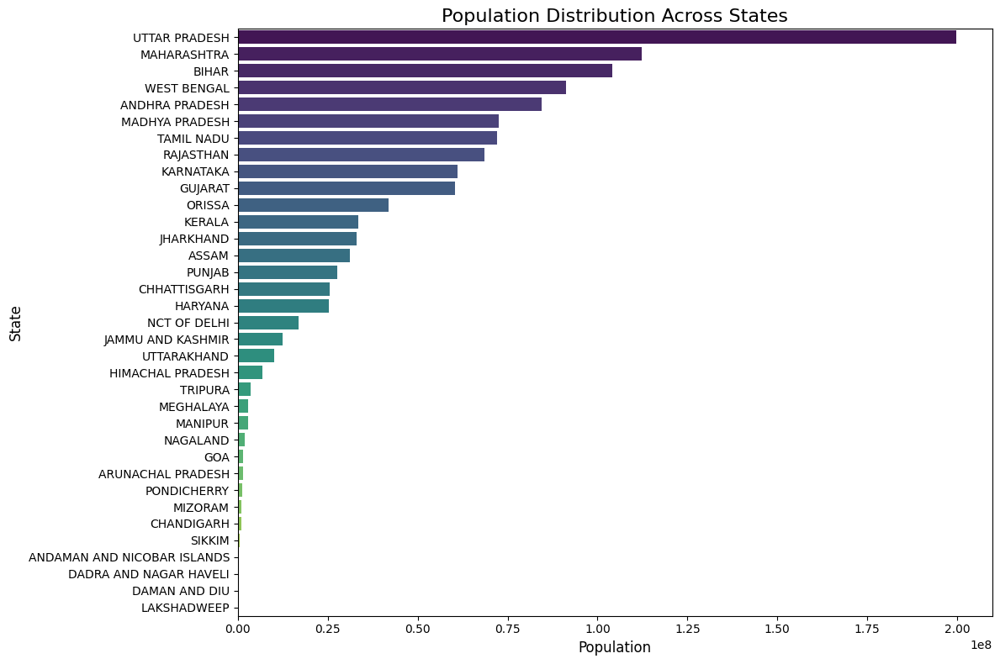

In [16]:
state_data=data.groupby('State_name')['Population'].sum().sort_values(ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(x=state_data.values,y=state_data.index,palette='viridis')
plt.xlabel("Population", fontsize=12)
plt.ylabel("State", fontsize=12)
plt.title("Population Distribution Across States", fontsize=16)
plt.tight_layout()
plt.show()

In [17]:
state_data

State_name
UTTAR PRADESH                  199812341
MAHARASHTRA                    112374333
BIHAR                          104099452
WEST BENGAL                     91276115
ANDHRA PRADESH                  84580777
MADHYA PRADESH                  72626809
TAMIL NADU                      72147030
RAJASTHAN                       68548437
KARNATAKA                       61095297
GUJARAT                         60439692
ORISSA                          41974218
KERALA                          33406061
JHARKHAND                       32988134
ASSAM                           31205576
PUNJAB                          27743338
CHHATTISGARH                    25545198
HARYANA                         25351462
NCT OF DELHI                    16787941
JAMMU AND KASHMIR               12541302
UTTARAKHAND                     10086292
HIMACHAL PRADESH                 6864602
TRIPURA                          3673917
MEGHALAYA                        2966889
MANIPUR                          2855794
NAGAL

In [ ]:
# 2) How do male and female populations vary across districts?

In [18]:
data.head(2)

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Christians,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,1700,5600,66,39,74948,39709,21751,600759,178435,89679
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,1489,5559,47,6,66459,41367,27950,503223,160933,88978


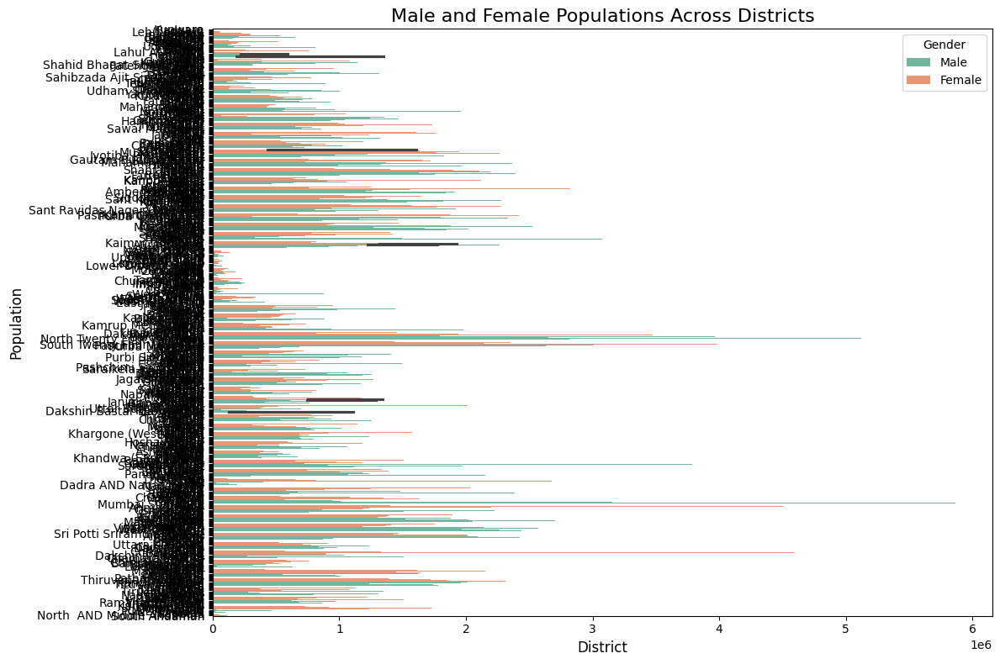

In [19]:
df_melted = data.melt(id_vars=['District_name', 'Population'], value_vars=['Male', 'Female'],
                    var_name='Gender', value_name='Pop')

# Grouped bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Pop', y='District_name', hue='Gender', data=df_melted, palette='Set2')

plt.title("Male and Female Populations Across Districts", fontsize=16)
plt.xlabel("District", fontsize=12)
plt.ylabel("Population", fontsize=12)
plt.legend(title="Gender")
plt.tight_layout()
plt.show()

In [20]:
df_melted

,District_name,Population,Gender,Pop
0,Kupwara,870354,Male,474190
1,Badgam,753745,Male,398041
2,Leh(Ladakh),133487,Male,78971
3,Kargil,140802,Male,77785
4,Punch,476835,Male,251899
...,...,...,...,...
1275,Mahe,41816,Female,22673
1276,Karaikal,200222,Female,102413
1277,Nicobars,36842,Female,16115
1278,North AND Middle Andaman,105597,Female,50736


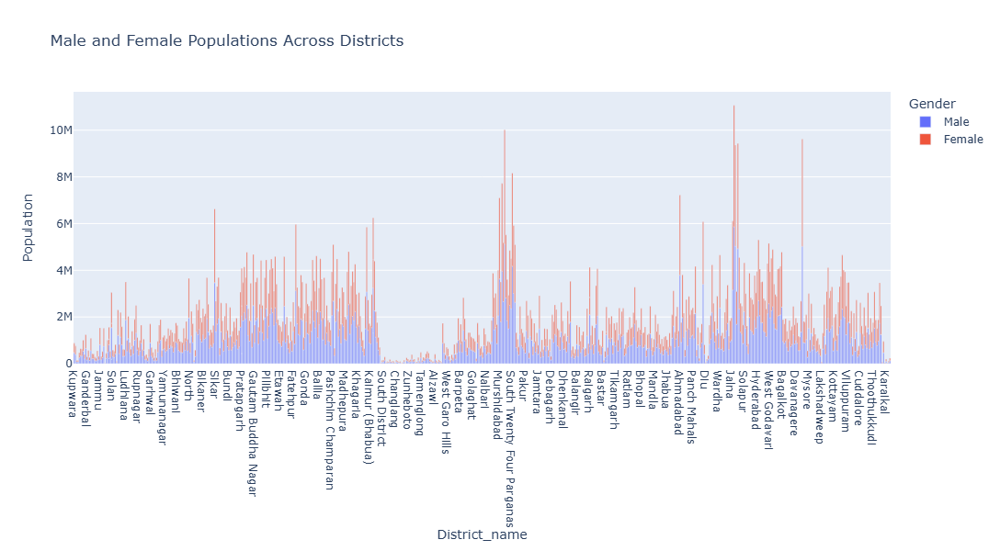

In [22]:
import plotly.express as px

# Create a Plotly bar chart
fig = px.bar(df_melted, x='District_name', y='Pop', color='Gender', 
             title="Male and Female Populations Across Districts",
             labels={'Pop': 'Population'}, 
             category_orders={'District_name': df_melted['District_name'].unique()},
             height=600)

# Show the plot
fig.show()


In [39]:
# 3) What is the ratio of male to female population for each state?

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\2446257393.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




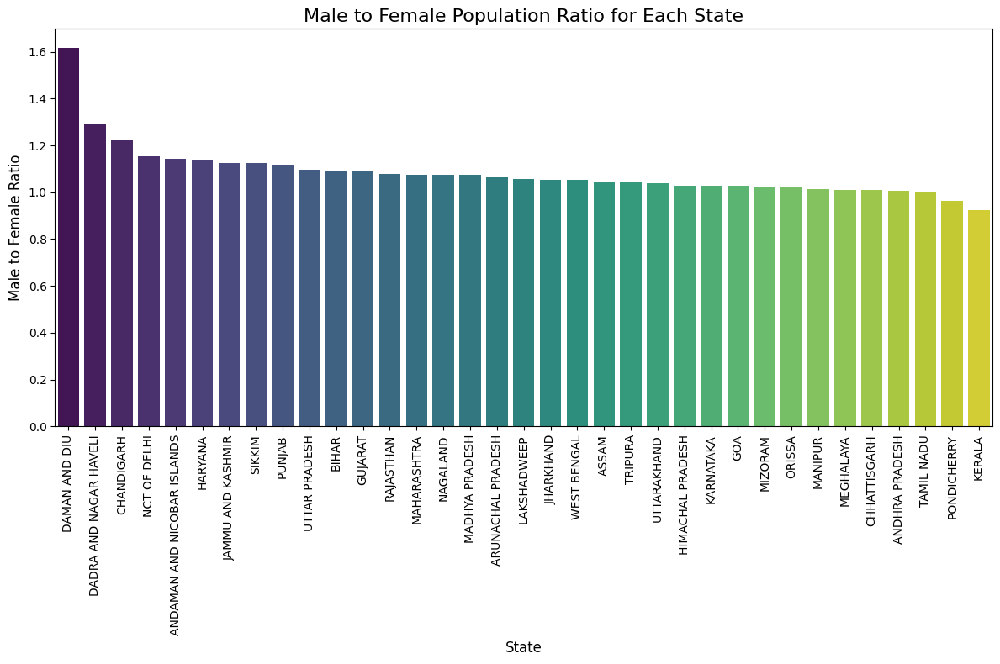

In [23]:
state_population=data.groupby('State_name')[['Male','Female']].sum()

# Calculate the male-to-female ratio
state_population['Male_to_Female_Ratio'] = state_population['Male'] / state_population['Female']
state_population_sorted = state_population.sort_values('Male_to_Female_Ratio', ascending=False)
plt.figure(figsize=(12, 8))
sns.barplot(x=state_population_sorted.index, y='Male_to_Female_Ratio', data=state_population_sorted, palette='viridis')
plt.title("Male to Female Population Ratio for Each State", fontsize=16)
plt.xlabel("State", fontsize=12)
plt.ylabel("Male to Female Ratio", fontsize=12)
plt.xticks(rotation=90)  
plt.tight_layout()
plt.show()

In [24]:
state_population_sorted

,Male,Female,Male_to_Female_Ratio
State_name,,,
DAMAN AND DIU,150301,92946,1.617079
DADRA AND NAGAR HAVELI,193760,149949,1.292173
CHANDIGARH,580663,474787,1.222997
NCT OF DELHI,8987326,7800615,1.152130
ANDAMAN AND NICOBAR ISLANDS,202871,177710,1.141585
HARYANA,13494734,11856728,1.138150
JAMMU AND KASHMIR,6640662,5900640,1.125414
SIKKIM,323070,287507,1.123694
PUNJAB,14639465,13103873,1.117186


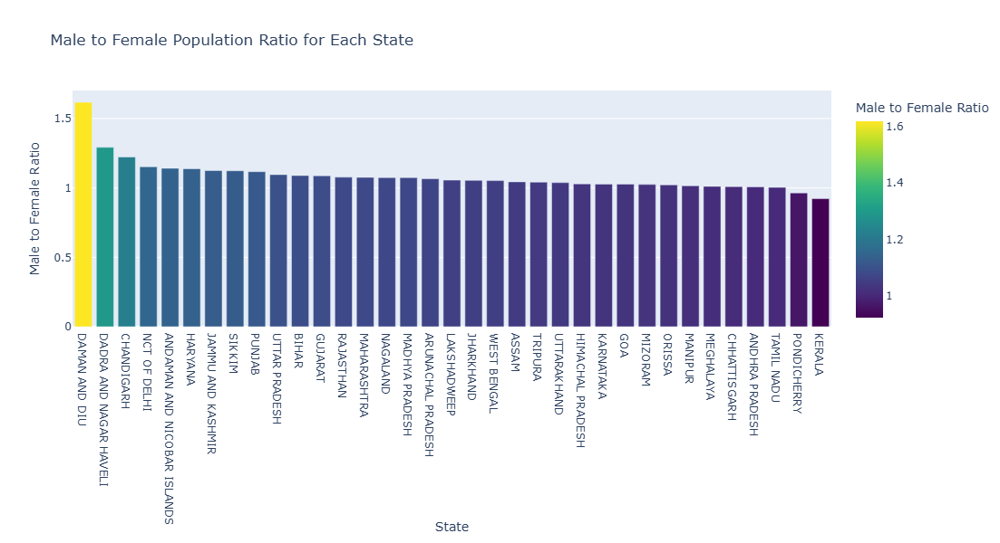

In [25]:
import plotly.express as px

state_population_sorted = state_population_sorted.reset_index()

# Create the bar plot
fig = px.bar(state_population_sorted, 
             x='State_name', 
             y='Male_to_Female_Ratio', 
             title="Male to Female Population Ratio for Each State",
             labels={'Male_to_Female_Ratio': 'Male to Female Ratio', 'State_name': 'State'},
             color='Male_to_Female_Ratio',  # Color by the ratio value
             color_continuous_scale='Viridis',  # Color scale
             height=600)

# Show the plot
fig.show()

In [47]:
# 4 Which districts have the highest and lowest populations?

In [29]:
sorted_df = data.sort_values(by='Population', ascending=False)

# Get the district with the highest population
highest_population_district = sorted_df.iloc[0]
print(highest_population_district[['District_name', 'Population']])
# Get the district with the lowest population
lowest_population_district = sorted_df.iloc[-1]
print(lowest_population_district[['District_name', 'Population']])

District_name       Thane
Population       11060148
Name: 516, dtype: object
District_name    Dibang Valley
Population                8004
Name: 256, dtype: object


##  Literacy

In [30]:
data.head(3)

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Christians,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,1700,5600,66,39,74948,39709,21751,600759,178435,89679
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,1489,5559,47,6,66459,41367,27950,503223,160933,88978
2,3,JAMMU AND KASHMIR,Leh(Ladakh),133487,78971,54516,93770,75079,53265,21814,...,658,1092,88635,103,16265,8923,6197,70703,41515,21019


In [ ]:
# 1 What is the literacy rate distribution across districts?

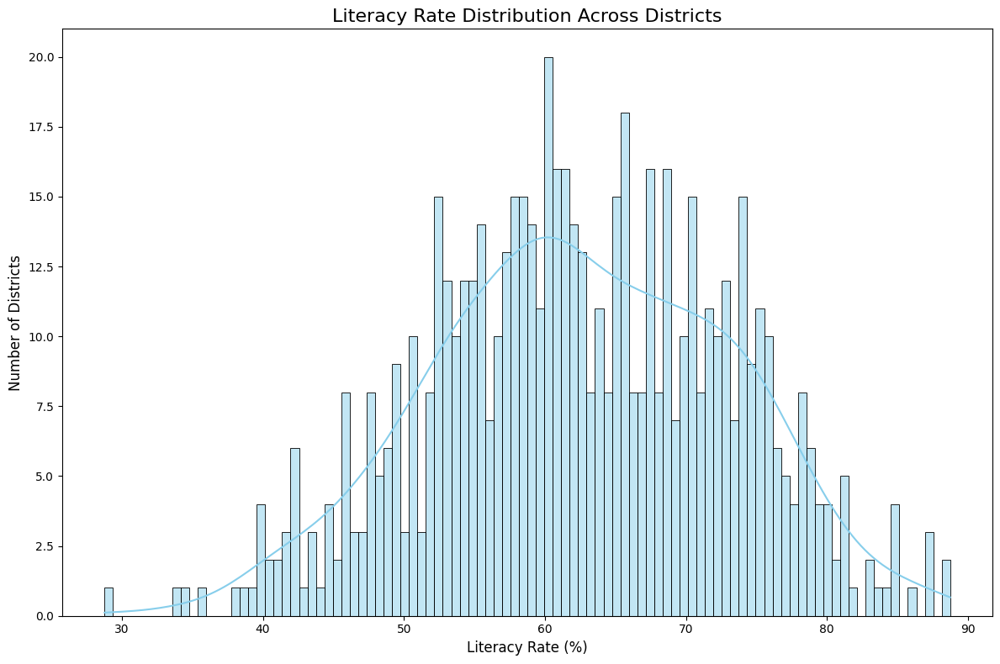

In [36]:
# Calculate Literacy Rate
data['Literacy_Rate'] = (data['Literate'] / data['Population']) * 100
plt.figure(figsize=(12, 8))
sns.histplot(data['Literacy_Rate'], bins=100, kde=True, color='skyblue')

# Formatting
plt.title("Literacy Rate Distribution Across Districts", fontsize=16)
plt.xlabel("Literacy Rate (%)", fontsize=12)
plt.ylabel("Number of Districts", fontsize=12)
plt.tight_layout()
plt.show()


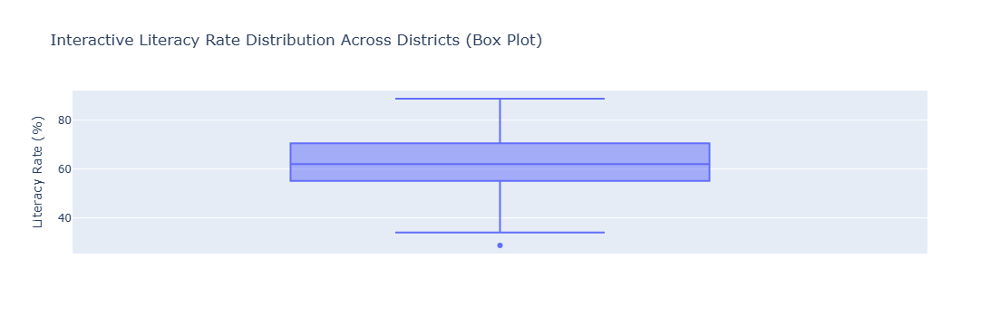

In [37]:
# interactive box plot for Literacy Rate distribution
fig = px.box(data, y='Literacy_Rate', title="Interactive Literacy Rate Distribution Across Districts (Box Plot)",
             labels={'Literacy_Rate': 'Literacy Rate (%)'})

# Show the plot
fig.show()

In [39]:
data['Literacy_Rate'].min()

28.77287897514263

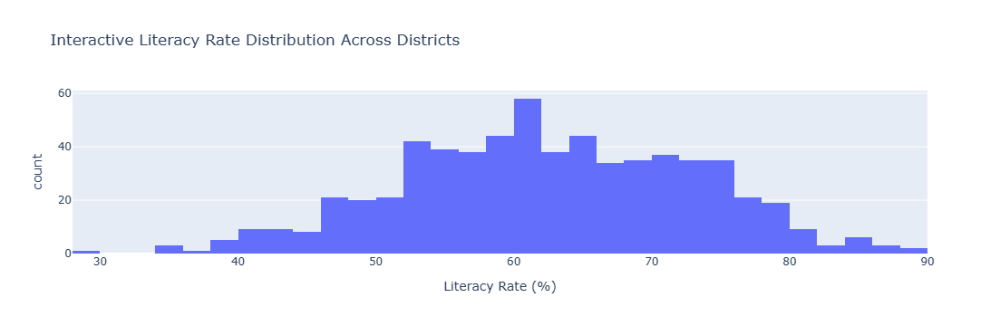

In [40]:
fig = px.histogram(data, x='Literacy_Rate', nbins=30, title="Interactive Literacy Rate Distribution Across Districts",
                   labels={'Literacy_Rate': 'Literacy Rate (%)'})

# Show the plot
fig.show()


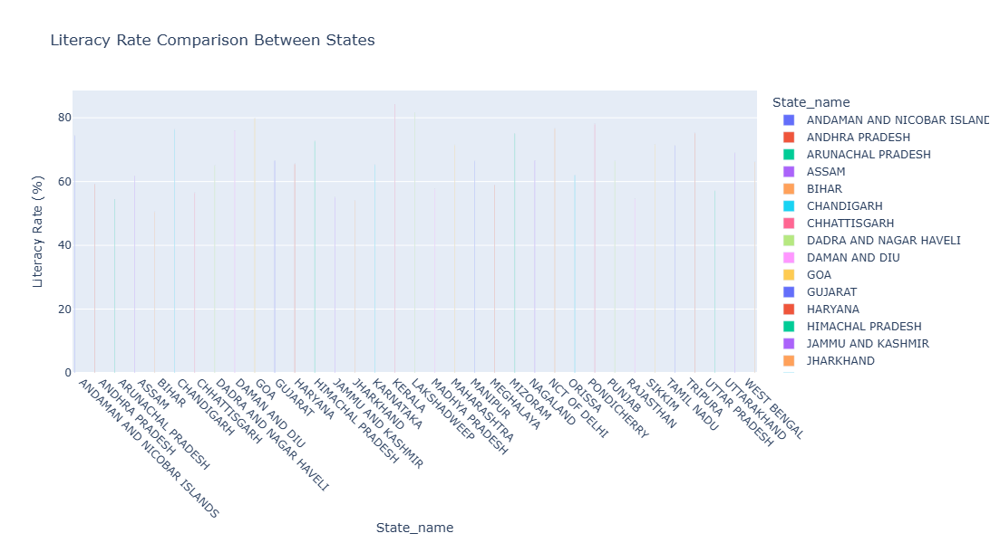

In [42]:
# 2  How does the literacy rate compare between states?

import plotly.express as px
state_literacy_rate = data.groupby('State_name')['Literacy_Rate'].mean().reset_index()
fig = px.bar(state_literacy_rate, x='State_name', y='Literacy_Rate', title="Literacy Rate Comparison Between States",
             labels={'Literacy_Rate': 'Literacy Rate (%)'},
             color='State_name', 
             text='Literacy_Rate'
             )  

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')  # Format text with 2 decimal points
fig.update_xaxes(tickangle=45)  # Rotate x-axis labels for better readability
fig.update_layout(barmode='group', height=600)

# Show the plot
fig.show()


In [57]:
# 3 Is there a correlation between literacy and the number of workers in a district?

correlation = data[['Literacy_Rate', 'Workers']].corr()
print(correlation)

               Literacy_Rate   Workers
Literacy_Rate       1.000000  0.082957
Workers             0.082957  1.000000


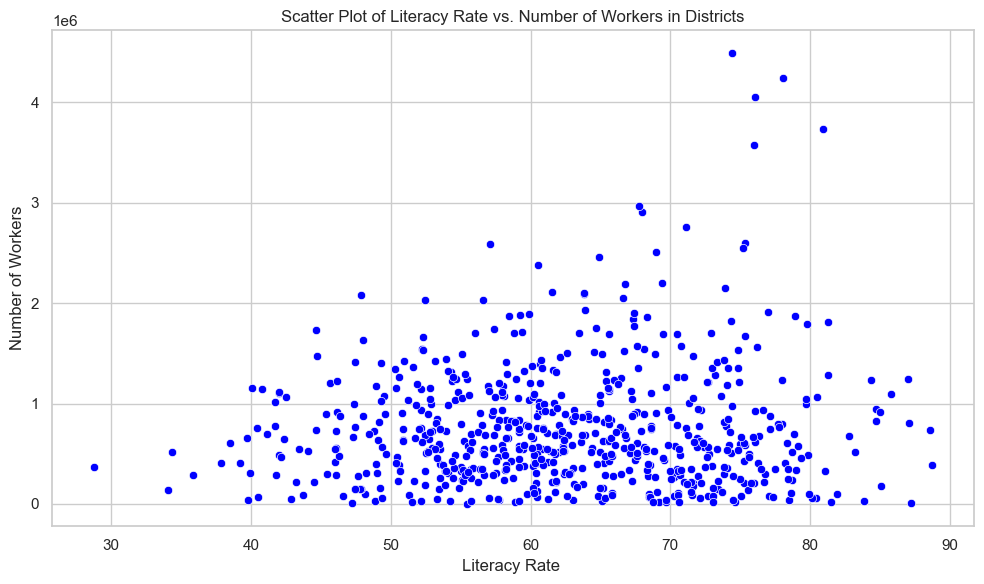

In [58]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Literacy_Rate', y='Workers', data=data, color='blue')
plt.title('Scatter Plot of Literacy Rate vs. Number of Workers in Districts')
plt.xlabel('Literacy Rate ')
plt.ylabel('Number of Workers')
plt.tight_layout()
plt.show()

##  3. Workers

In [60]:
# 1 What is the proportion of male and female workers in each district?

In [61]:
data.head(2)

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50,Literacy_Rate
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,5600,66,39,74948,39709,21751,600759,178435,89679,50.514388
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,5559,47,6,66459,41367,27950,503223,160933,88978,44.530843


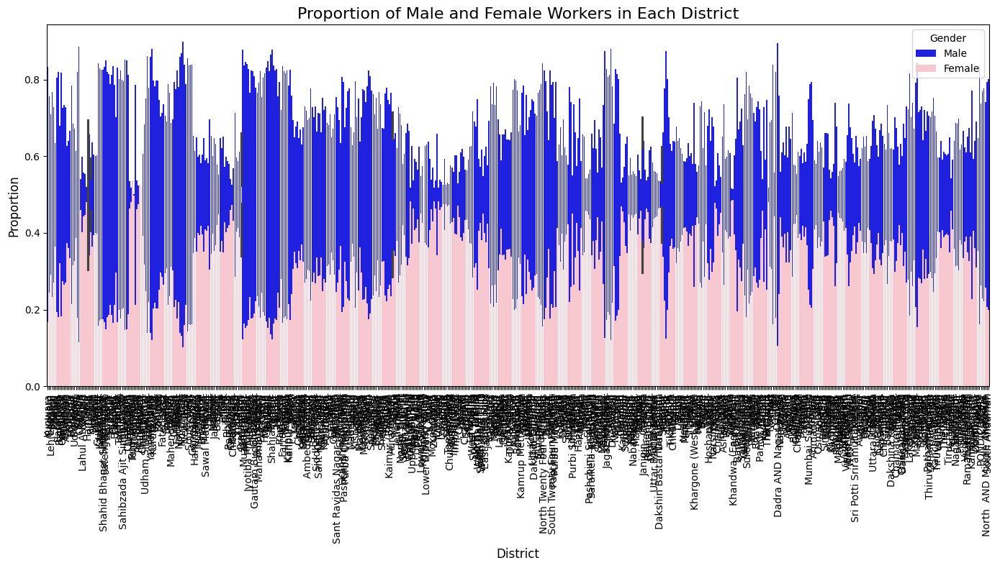

In [112]:
data['Male_Worker_Proportion'] = data['Male_Workers'] / data['Workers']
data['Female_Worker_Proportion'] = data['Female_Workers'] / data['Workers']

plt.figure(figsize=(14, 8))

# Grouped bar plot
sns.barplot(x='District_name', y='Male_Worker_Proportion', data=data, color='blue', label='Male')
sns.barplot(x='District_name', y='Female_Worker_Proportion', data=data, color='pink', label='Female')

plt.title("Proportion of Male and Female Workers in Each District", fontsize=16)
plt.xlabel("District", fontsize=12)
plt.ylabel("Proportion", fontsize=12)
plt.xticks(rotation=90)  
plt.legend(title="Gender")
plt.tight_layout()
plt.show()

In [113]:
data.head()

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Literacy_Rate,Total_Population,Higher_Education_Percentage,Secondary_Education_Percentage,Graduate_Education_Percentage,Age_Group_0_29_Percentage,Age_Group_30_49_Percentage,Age_Group_50_Percentage,Male_Worker_Proportion,Female_Worker_Proportion
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,50.514388,867819,4.562396,8.611209,2.499098,69.024673,20.501428,10.303738,0.833387,0.166613
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,44.530843,753265,5.488196,8.817173,3.708151,66.763030,21.351120,11.804788,0.756648,0.243352
2,3,JAMMU AND KASHMIR,Leh(Ladakh),133487,78971,54516,93770,75079,53265,21814,...,70.246541,132427,6.684546,12.184707,4.642400,52.966206,31.100407,15.746103,0.709453,0.290547
3,4,JAMMU AND KASHMIR,Kargil,140802,77785,63017,86236,51873,39839,12034,...,61.246289,140509,6.978594,12.029659,2.185338,62.166731,25.256033,12.420278,0.768010,0.231990
4,5,JAMMU AND KASHMIR,Punch,476835,251899,224936,261724,161393,117677,43716,...,54.887749,476122,6.190192,9.659945,2.928057,63.959021,23.030608,12.862730,0.729133,0.270867


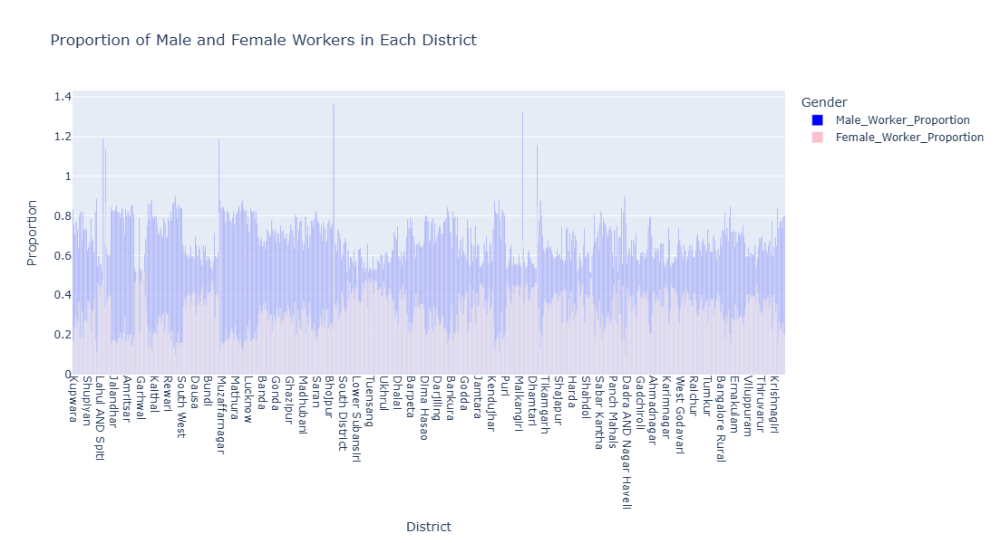

In [114]:
import plotly.express as px

data['Male_Worker_Proportion'] = data['Male_Workers'] / data['Workers']
data['Female_Worker_Proportion'] = data['Female_Workers'] / data['Workers']

fig = px.bar(data, x='District_name', 
             y=['Male_Worker_Proportion', 'Female_Worker_Proportion'],
             title="Proportion of Male and Female Workers in Each District",
             labels={'District_name': 'District', 
                     'value': 'Proportion', 
                     'variable': 'Gender'},
             barmode='group', 
             color='variable',
             color_discrete_map={'Male_Worker_Proportion': 'blue', 'Female_Worker_Proportion': 'pink'},
             text='value')

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')

# Add interactive features
fig.update_layout(
    xaxis_title="District",
    yaxis_title="Proportion",
    xaxis_tickangle=90,  
    height=600
)
fig.show()


In [64]:
# 2 How does the number of workers vary across different states?

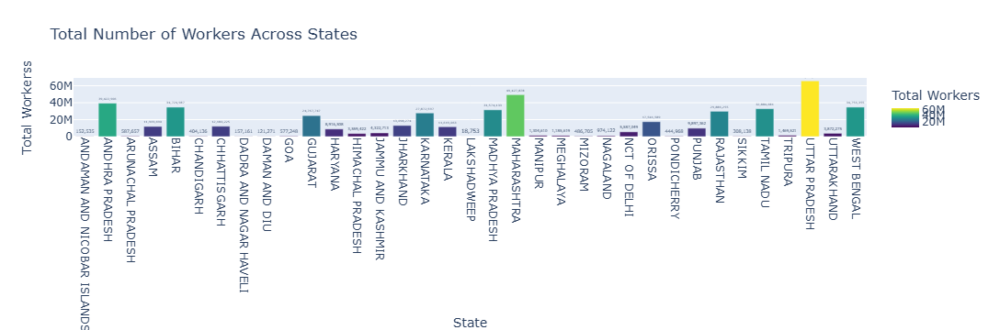

In [117]:
import plotly.express as px

state_workers = data.groupby('State_name')['Workers'].sum().reset_index()
fig = px.bar(state_workers, x='State_name', y='Workers',
             title="Total Number of Workers Across States",
             labels={'Workers': 'Total Workers', 'State_name': 'State'},
             color='Workers', 
             color_continuous_scale='Viridis',
             text='Workers')
fig.update_traces(texttemplate='%{text:,}', textposition='outside')

# Add interactive features
fig.update_layout(
    xaxis_title="State",
    yaxis_title="Total Workerss",
    xaxis_tickangle=90, 
    height=600
)

# Show the plot
fig.show()


In [118]:
state_workers

,State_name,Workers
0,ANDAMAN AND NICOBAR ISLANDS,152535
1,ANDHRA PRADESH,39422906
2,ARUNACHAL PRADESH,587657
3,ASSAM,11969690
4,BIHAR,34724987
5,CHANDIGARH,404136
6,CHHATTISGARH,12180225
7,DADRA AND NAGAR HAVELI,157161
8,DAMAN AND DIU,121271
9,GOA,577248


C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\2998474787.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




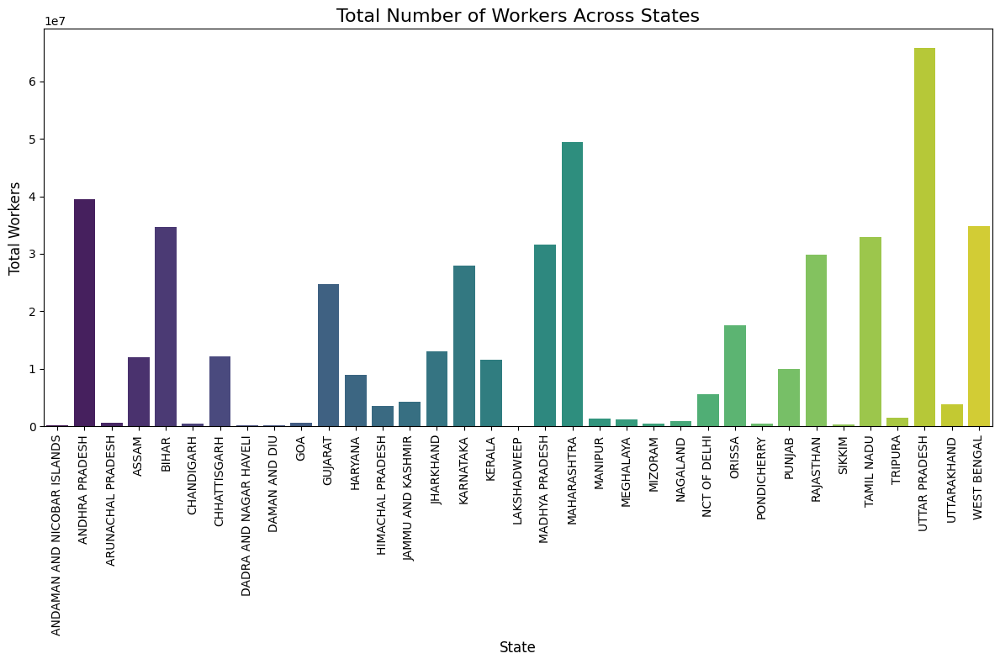

In [119]:
plt.figure(figsize=(12, 8))

sns.barplot(x='State_name', y='Workers', data=state_workers, palette='viridis')
plt.xticks(rotation=90) 
plt.title("Total Number of Workers Across States", fontsize=16)
plt.xlabel("State", fontsize=12)
plt.ylabel("Total Workers", fontsize=12)

plt.tight_layout()
plt.show()

In [128]:
x=data.groupby('State_name')[['Male_Workers','Female_Workers']].sum().reset_index()
x

,State_name,Male_Workers,Female_Workers
0,ANDAMAN AND NICOBAR ISLANDS,120889,31646
1,ANDHRA PRADESH,24185595,15237311
2,ARUNACHAL PRADESH,350273,237384
3,ASSAM,8541560,3428130
4,BIHAR,25222189,9502798
5,CHANDIGARH,328159,75977
6,CHHATTISGARH,7133866,5046359
7,DADRA AND NAGAR HAVELI,119293,37868
8,DAMAN AND DIU,107434,13837
9,GOA,419536,157712


In [120]:
data.head(2)



,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Literacy_Rate,Total_Population,Higher_Education_Percentage,Secondary_Education_Percentage,Graduate_Education_Percentage,Age_Group_0_29_Percentage,Age_Group_30_49_Percentage,Age_Group_50_Percentage,Male_Worker_Proportion,Female_Worker_Proportion
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,50.514388,867819,4.562396,8.611209,2.499098,69.024673,20.501428,10.303738,0.833387,0.166613
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,44.530843,753265,5.488196,8.817173,3.708151,66.763030,21.351120,11.804788,0.756648,0.243352


In [70]:
# 3 What is the distribution of cultivator workers across districts?

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\2192513593.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='District_name', y='Cultivator_Workers', data=data, palette='viridis')


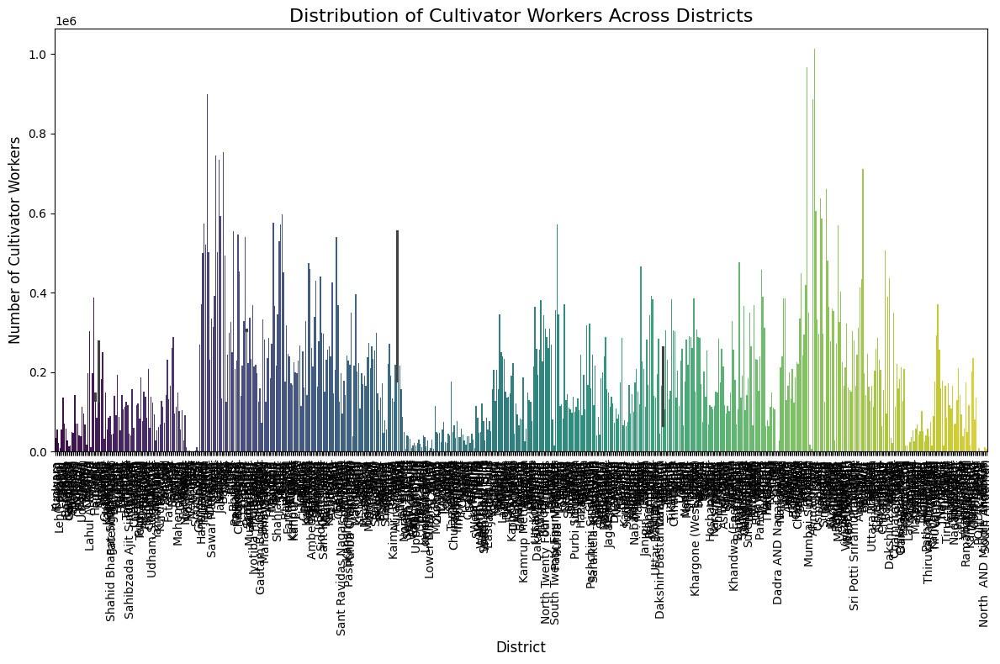

In [4]:


# Bar plot for cultivator workers across districts
plt.figure(figsize=(12, 8))
sns.barplot(x='District_name', y='Cultivator_Workers', data=data, palette='viridis')

# Formatting the plot
plt.title('Distribution of Cultivator Workers Across Districts', fontsize=16)
plt.xlabel('District', fontsize=12)
plt.ylabel('Number of Cultivator Workers', fontsize=12)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


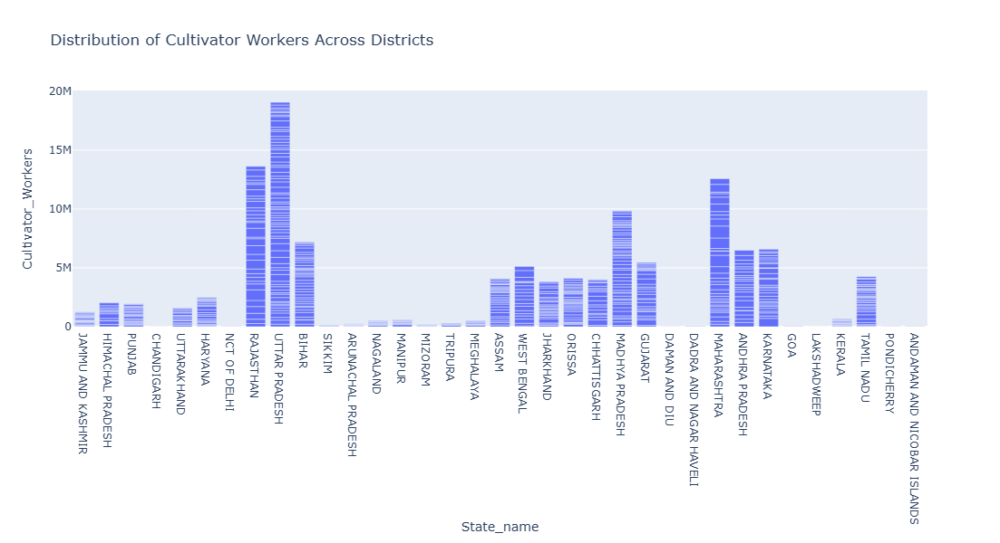

In [127]:
fig=px.bar(data,x=data['State_name'],y=data['Cultivator_Workers'],
               title='Distribution of Cultivator Workers Across Districts',
               height=600)
fig.show()

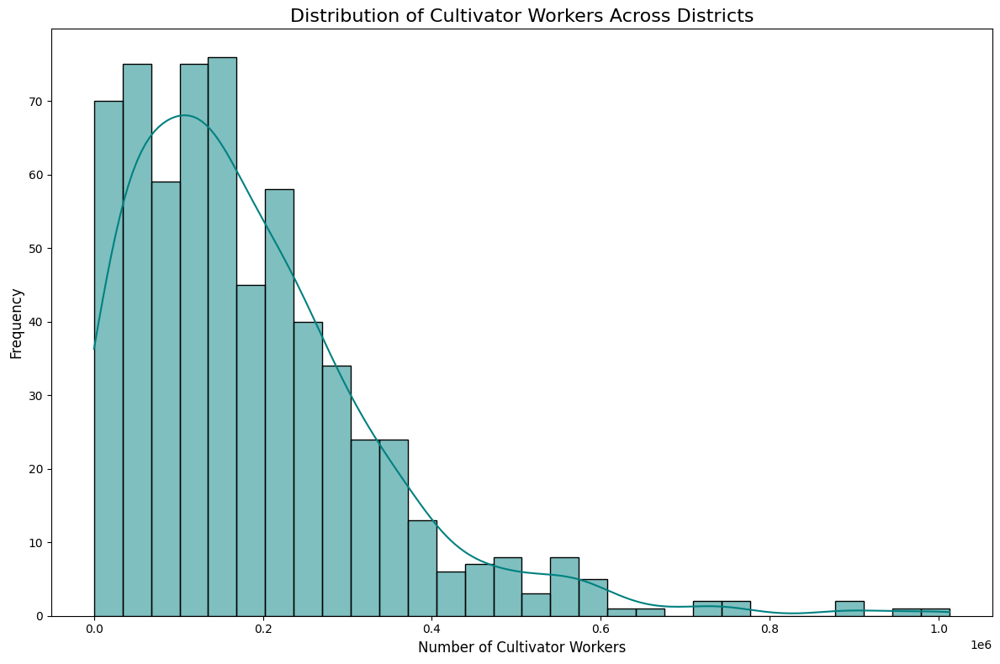

In [6]:
plt.figure(figsize=(12, 8))
sns.histplot(data['Cultivator_Workers'], bins=30, kde=True, color='teal')

plt.title('Distribution of Cultivator Workers Across Districts', fontsize=16)
plt.xlabel('Number of Cultivator Workers', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()


In [7]:
# 4 How do agricultural workers compare to household workers in different districts?

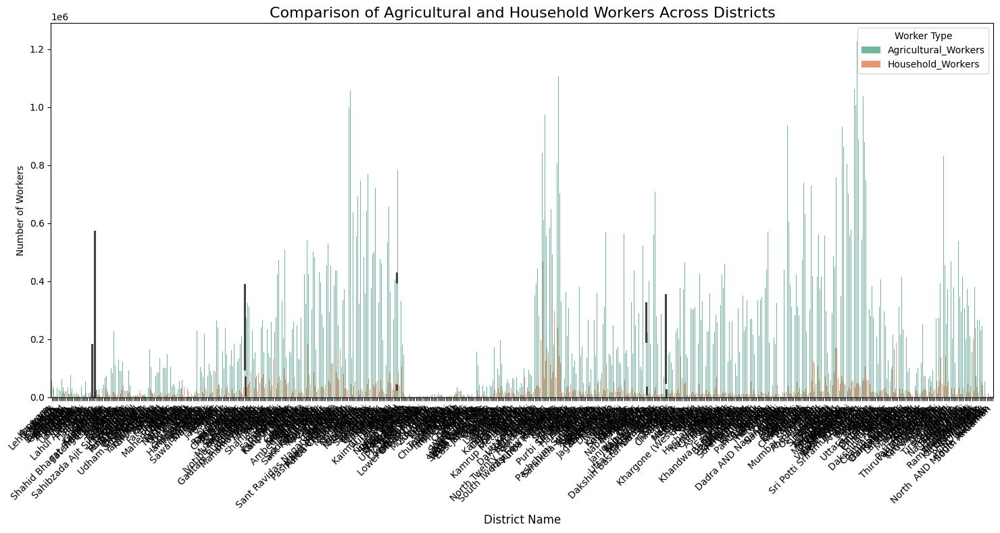

In [9]:
worker_comparison = data[['District_name', 'Agricultural_Workers', 'Household_Workers']]
worker_comparison_melted = worker_comparison.melt(id_vars='District_name', 
                                                  value_vars=['Agricultural_Workers', 'Household_Workers'], 
                                                  var_name='Worker_Type', 
                                                  value_name='Worker_Count')

plt.figure(figsize=(15, 8))
sns.barplot(x='District_name', y='Worker_Count', hue='Worker_Type', data=worker_comparison_melted, palette='Set2')

plt.title('Comparison of Agricultural and Household Workers Across Districts', fontsize=16)
plt.xlabel('District Name', fontsize=12)
plt.ylabel('Number of Workers')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Worker Type')
plt.tight_layout()
plt.show()


In [130]:
worker_comparison_melted

,District_name,Worker_Type,Worker_Count
0,Kupwara,Agricultural_Workers,56759
1,Badgam,Agricultural_Workers,36630
2,Leh(Ladakh),Agricultural_Workers,1645
3,Kargil,Agricultural_Workers,3763
4,Punch,Agricultural_Workers,31583
...,...,...,...
1275,Mahe,Household_Workers,69
1276,Karaikal,Household_Workers,1327
1277,Nicobars,Household_Workers,2560
1278,North AND Middle Andaman,Household_Workers,260


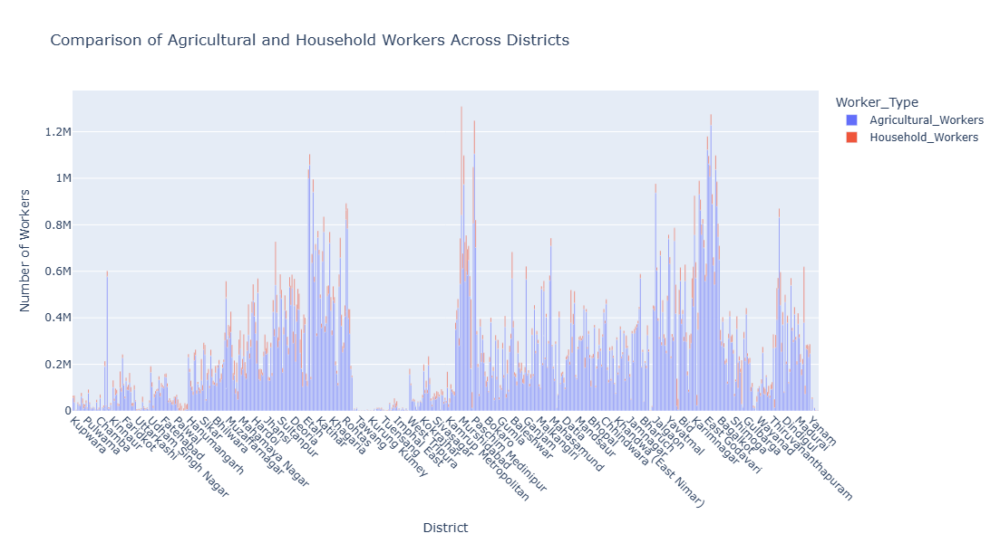

In [131]:
import plotly.express as px
worker_comparison = data[['District_name', 'Agricultural_Workers', 'Household_Workers']].set_index('District_name')
worker_comparison_reset = worker_comparison.reset_index().melt(id_vars='District_name', 
                                                               value_vars=['Agricultural_Workers', 'Household_Workers'], 
                                                               var_name='Worker_Type', 
                                                               value_name='Worker_Count')
fig = px.bar(worker_comparison_reset, x='District_name', y='Worker_Count', color='Worker_Type',
             title='Comparison of Agricultural and Household Workers Across Districts',
             labels={'Worker_Count': 'Number of Workers', 'District_name': 'District'},
              height=600)

fig.update_layout(xaxis_tickangle=45)
fig.show()


In [12]:
#5 What is the relationship between total workers and population in a district

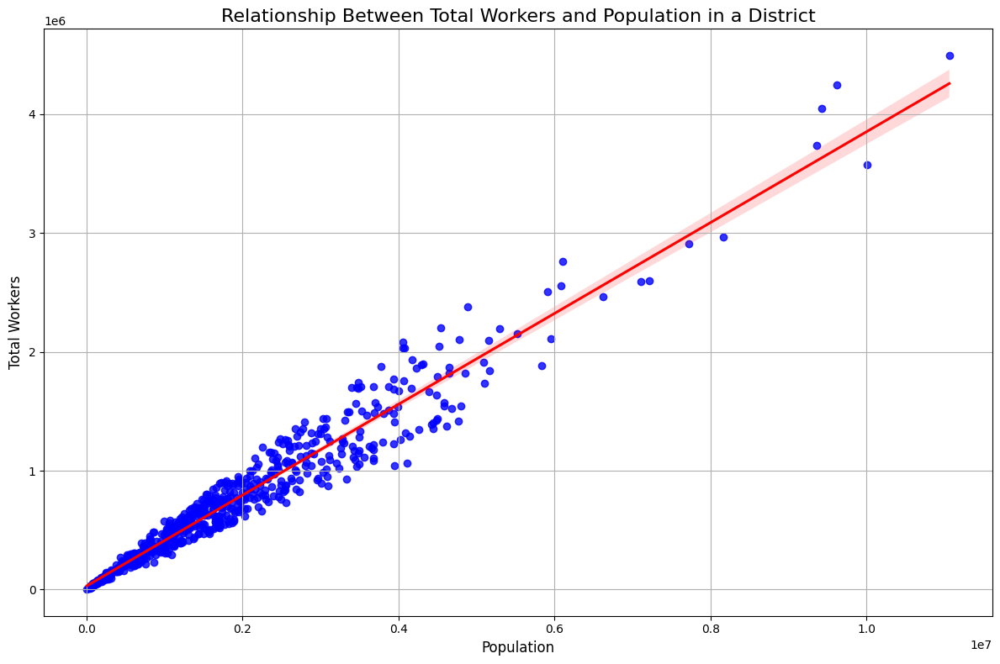

In [14]:

plt.figure(figsize=(12, 8))
sns.regplot(x='Population', y='Workers', data=data, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

plt.title('Relationship Between Total Workers and Population in a District', fontsize=16)
plt.xlabel('Population', fontsize=12)
plt.ylabel('Total Workers', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


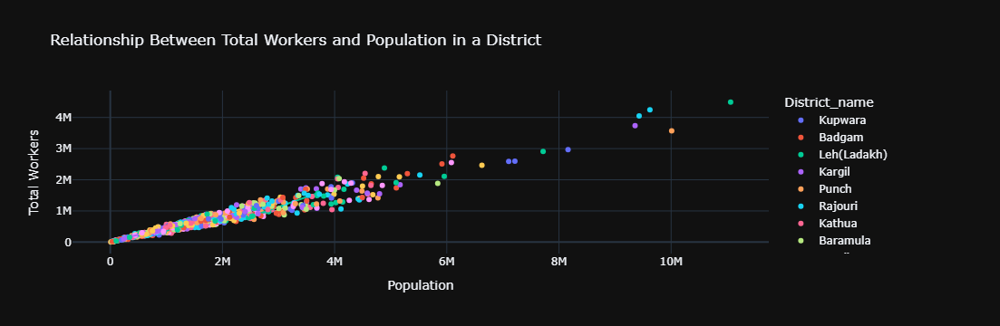

In [43]:
import plotly.express as px

# Scatter plot with Plotly
fig = px.scatter(data, x='Population', y='Workers', 
                 title='Relationship Between Total Workers and Population in a District',
                 labels={'Population': 'Population', 'Workers': 'Total Workers'},
                 trendline='ols',  # Adds a regression line
                 color='District_name',  
                 hover_data=['District_name'])  

# Update layout
fig.update_layout(template='plotly_dark', height=600)
fig.show()


#  Religion 

### 1 What is the distribution of Hindus, Muslims, Christians, Sikhs, Buddhists, and Jains in the dataset? 

In [45]:
data.head(2)

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50,Literacy_Rate
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,5600,66,39,74948,39709,21751,600759,178435,89679,50.514388
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,5559,47,6,66459,41367,27950,503223,160933,88978,44.530843


In [134]:
religion_data = ['Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']
population_data=data[religion_data].sum()

religion_df=pd.DataFrame({'Religion':religion_data,'Population':population_data.values})
print(religion_df)


     Religion  Population
0      Hindus   966257353
1     Muslims   172245158
2  Christians    27819588
3       Sikhs    20833116
4   Buddhists     8442972
5       Jains     4451753


C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1966405813.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




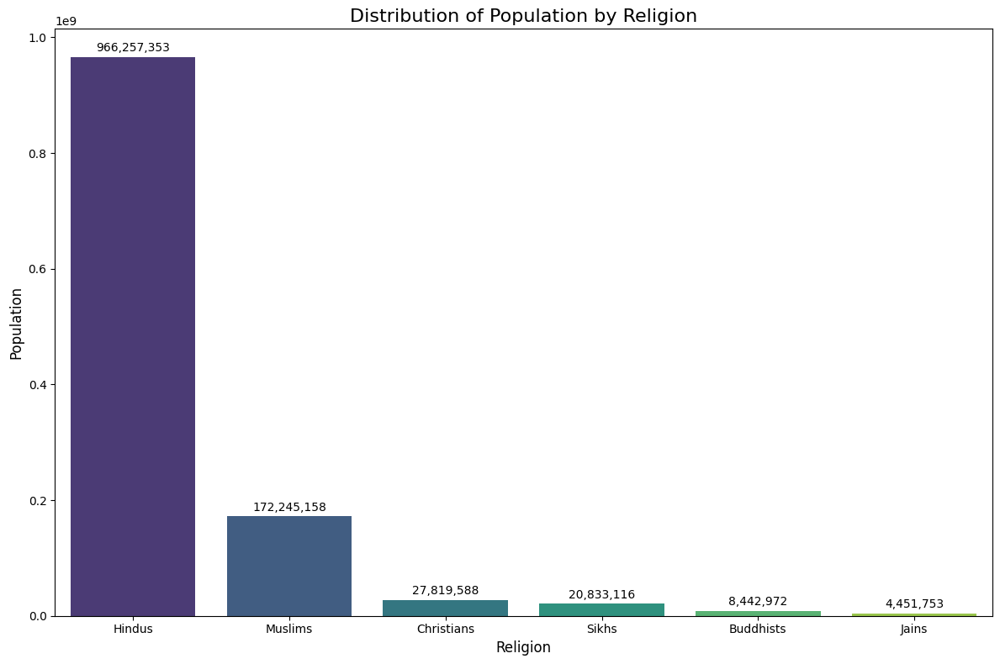

In [135]:
plt.figure(figsize=(12,8))
sns.barplot(x='Religion',y='Population',data=religion_df,palette='viridis')
plt.title('Distribution of Population by Religion', fontsize=16)
plt.xlabel('Religion', fontsize=12)
plt.ylabel('Population', fontsize=12)
plt.tight_layout()

for i, value in enumerate(religion_df['Population']):
    plt.text(i, value + 0.01 * max(religion_df['Population']), f"{value:,.0f}", 
             ha='center', fontsize=10) 
plt.show()

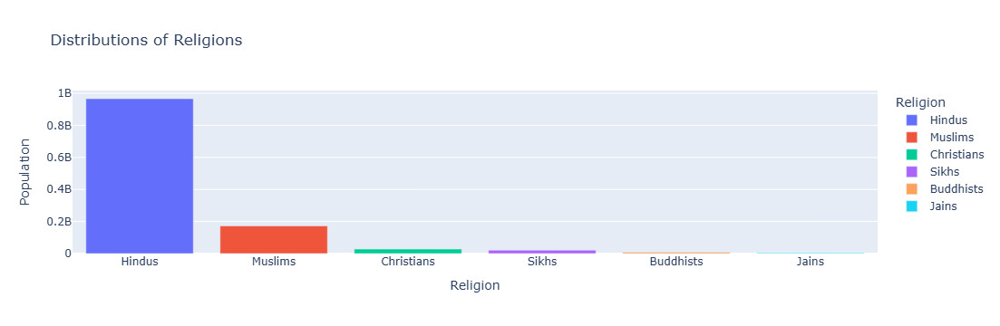

In [67]:
import plotly.express as px
fig=px.bar(religion_df,x='Religion',y='Population',
          color='Religion',title='Distributions of Religions'
          )
fig.show()

### 2 How does the religious composition vary across states? 

In [68]:
data.head(2)

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50,Literacy_Rate
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,5600,66,39,74948,39709,21751,600759,178435,89679,50.514388
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,5559,47,6,66459,41367,27950,503223,160933,88978,44.530843


In [136]:
religion_by_state = data.groupby('State_name')[['Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']].sum()

religion_by_state_percentage = religion_by_state.div(religion_by_state.sum(axis=1), axis=0) * 100

In [138]:
religion_by_state_percentage

,Hindus,Muslims,Christians,Sikhs,Buddhists,Jains
State_name,,,,,,
ANDAMAN AND NICOBAR ISLANDS,69.671120,8.544397,21.348208,0.339003,0.089100,0.008172
ANDHRA PRADESH,88.899490,9.602813,1.342310,0.047814,0.043594,0.063979
ARUNACHAL PRADESH,39.612193,2.665777,41.273659,0.323994,16.048381,0.075996
ASSAM,61.619811,34.308299,3.745446,0.066411,0.176670,0.083363
BIHAR,82.900378,16.909517,0.124475,0.022901,0.024513,0.018216
CHANDIGARH,80.874795,4.880240,0.827175,13.121828,0.110037,0.185925
CHHATTISGARH,95.175065,2.057741,1.960024,0.279838,0.281560,0.245771
DADRA AND NAGAR HAVELI,94.146893,3.768127,1.490979,0.063278,0.184878,0.345844
DAMAN AND DIU,90.625425,7.935436,1.160862,0.070804,0.089329,0.118144


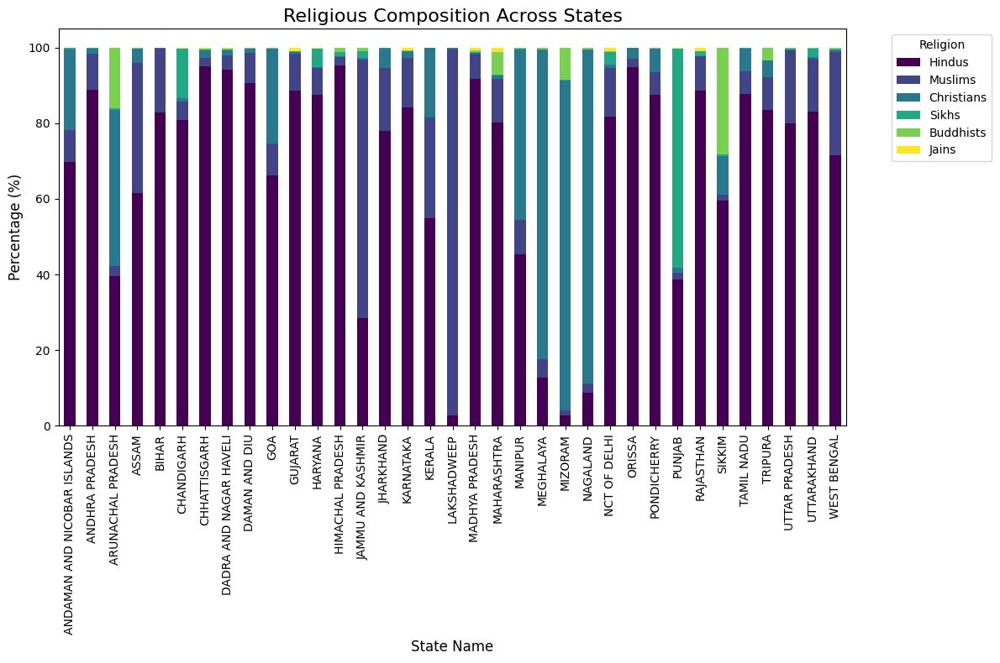

In [82]:
religion_by_state_percentage.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='viridis')

plt.title('Religious Composition Across States', fontsize=16)
plt.xlabel('State Name', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(title='Religion', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [83]:
religion_by_state_percentage

,Hindus,Muslims,Christians,Sikhs,Buddhists,Jains
State_name,,,,,,
ANDAMAN AND NICOBAR ISLANDS,69.671120,8.544397,21.348208,0.339003,0.089100,0.008172
ANDHRA PRADESH,88.899490,9.602813,1.342310,0.047814,0.043594,0.063979
ARUNACHAL PRADESH,39.612193,2.665777,41.273659,0.323994,16.048381,0.075996
ASSAM,61.619811,34.308299,3.745446,0.066411,0.176670,0.083363
BIHAR,82.900378,16.909517,0.124475,0.022901,0.024513,0.018216
CHANDIGARH,80.874795,4.880240,0.827175,13.121828,0.110037,0.185925
CHHATTISGARH,95.175065,2.057741,1.960024,0.279838,0.281560,0.245771
DADRA AND NAGAR HAVELI,94.146893,3.768127,1.490979,0.063278,0.184878,0.345844
DAMAN AND DIU,90.625425,7.935436,1.160862,0.070804,0.089329,0.118144


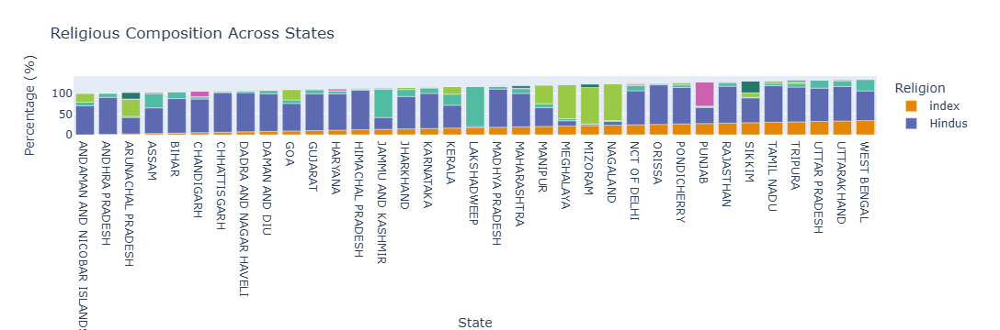

<Figure size 1400x1000 with 0 Axes>

In [89]:

religion_by_state_percentage.reset_index(inplace=True)
religion_melted = religion_by_state_percentage.melt(id_vars='State_name', 
                                                    var_name='Religion', 
                                                    value_name='Percentage')
fig = px.bar(religion_melted, x='State_name', y='Percentage', color='Religion', 
             title='Religious Composition Across States',
             labels={'Percentage': 'Percentage (%)', 'State_name': 'State'},
             color_discrete_sequence=px.colors.qualitative.Vivid,
             height=600)
fig.show()

In [88]:
religion_by_state_percentage

,State_name,Hindus,Muslims,Christians,Sikhs,Buddhists,Jains
0,ANDAMAN AND NICOBAR ISLANDS,69.671120,8.544397,21.348208,0.339003,0.089100,0.008172
1,ANDHRA PRADESH,88.899490,9.602813,1.342310,0.047814,0.043594,0.063979
2,ARUNACHAL PRADESH,39.612193,2.665777,41.273659,0.323994,16.048381,0.075996
3,ASSAM,61.619811,34.308299,3.745446,0.066411,0.176670,0.083363
4,BIHAR,82.900378,16.909517,0.124475,0.022901,0.024513,0.018216
5,CHANDIGARH,80.874795,4.880240,0.827175,13.121828,0.110037,0.185925
6,CHHATTISGARH,95.175065,2.057741,1.960024,0.279838,0.281560,0.245771
7,DADRA AND NAGAR HAVELI,94.146893,3.768127,1.490979,0.063278,0.184878,0.345844
8,DAMAN AND DIU,90.625425,7.935436,1.160862,0.070804,0.089329,0.118144
9,GOA,66.234552,8.353490,25.159286,0.101220,0.075245,0.076207


### 3 Are there districts where a single religion dominates significantly? 

In [28]:
data['Total_Population'] = data[['Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']].sum(axis=1)

# Calculate the percentage
religion_percentages = data[['Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']].div(data['Total_Population'], axis=0) * 100

# Add district names for reference
religion_percentages['District_name'] = data['District_name']

# Identify the dominant religion in each district
religion_percentages['Dominant_Religion'] = religion_percentages[['Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']].idxmax(axis=1)

religion_percentages['Dominance_Percentage'] = religion_percentages[
    ['Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']
].max(axis=1)  

dominant_districts = religion_percentages[religion_percentages['Dominance_Percentage'] > 80]

dominant_districts[['District_name', 'Dominant_Religion', 'Dominance_Percentage']]


,District_name,Dominant_Religion,Dominance_Percentage
0,Kupwara,Muslims,94.868400
1,Badgam,Muslims,97.715147
4,Punch,Muslims,90.581616
6,Kathua,Hindus,87.713004
7,Baramula,Muslims,95.323491
...,...,...,...
630,Krishnagiri,Hindus,91.885693
631,Coimbatore,Hindus,88.227776
632,Tiruppur,Hindus,92.116683
633,Yanam,Hindus,96.273984


In [30]:
religion_percentages

,Hindus,Muslims,Christians,Sikhs,Buddhists,Jains,District_name,Dominant_Religion,Dominance_Percentage
0,4.278311,94.868400,0.195893,0.645296,0.007605,0.004494,Kupwara,Muslims,94.868400
1,1.342157,97.715147,0.197673,0.737987,0.006240,0.000797,Badgam,Muslims,97.715147
2,17.278954,14.390570,0.496878,0.824605,66.931215,0.077779,Leh(Ladakh),Buddhists,66.931215
3,7.359671,77.033500,0.429866,0.833399,14.323638,0.019928,Kargil,Muslims,77.033500
4,6.847825,90.581616,0.201209,2.349818,0.017433,0.002100,Punch,Muslims,90.581616
...,...,...,...,...,...,...,...,...,...
635,66.854900,30.761868,2.292305,0.007178,0.050249,0.033499,Mahe,Hindus,66.854900
636,76.308698,14.415554,9.194259,0.022997,0.031496,0.026996,Karaikal,Hindus,76.308698
637,23.747128,3.654667,71.334391,0.938286,0.325528,0.000000,Nicobars,Christians,71.334391
638,77.031785,2.054801,20.756812,0.073081,0.079724,0.003796,North AND Middle Andaman,Hindus,77.031785


# Education

In [4]:
data.head(2)

,District_code,State_name,District_name,Population,Male,Female,Literate,Workers,Male_Workers,Female_Workers,...,Christians,Sikhs,Buddhists,Jains,Secondary_Education,Higher_Education,Graduate_Education,Age_Group_0_29,Age_Group_30_49,Age_Group_50
0,1,JAMMU AND KASHMIR,Kupwara,870354,474190,396164,439654,229064,190899,38165,...,1700,5600,66,39,74948,39709,21751,600759,178435,89679
1,2,JAMMU AND KASHMIR,Badgam,753745,398041,355704,335649,214866,162578,52288,...,1489,5559,47,6,66459,41367,27950,503223,160933,88978


### 1 What is the distribution of secondary education levels across districts? 

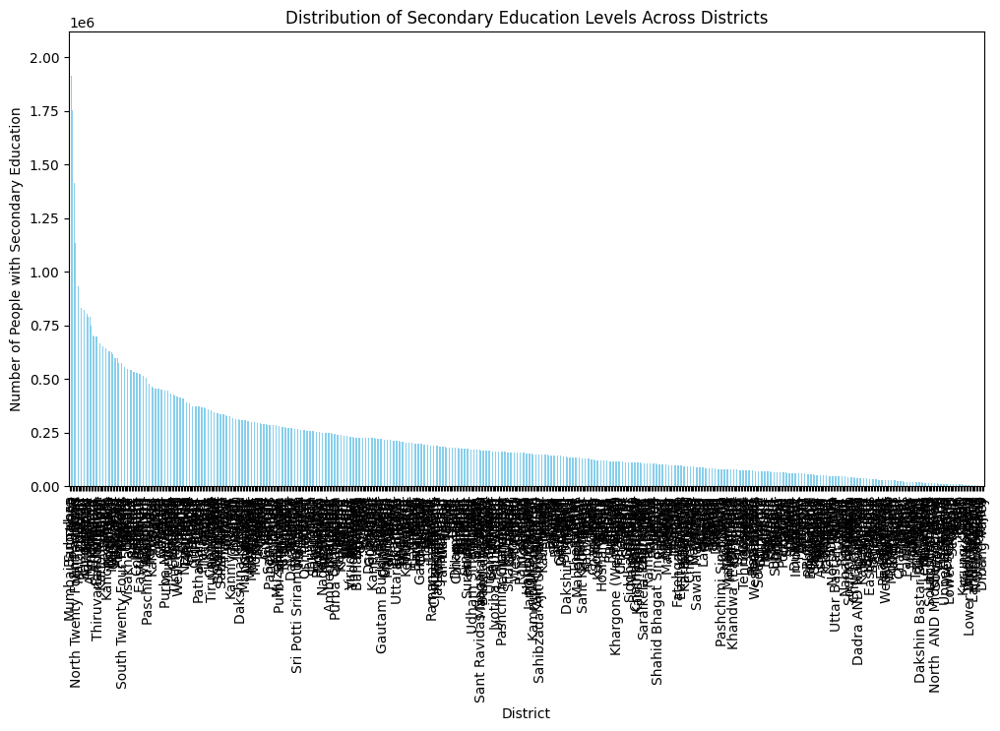

In [95]:
district_secondary_education = data.groupby('District_name')['Secondary_Education'].sum()

district_secondary_education = district_secondary_education.sort_values(ascending=False)

plt.figure(figsize=(12, 6))
district_secondary_education.plot(kind='bar', color='skyblue')
plt.title('Distribution of Secondary Education Levels Across Districts')
plt.xlabel('District')
plt.ylabel('Number of People with Secondary Education')
plt.xticks(rotation=90) 
plt.show()

In [96]:
district_secondary_education

District_name
Bangalore          2018079
Mumbai Suburban    1914168
Thane              1751284
Pune               1414563
Ahmadabad          1135058
                    ...   
North  District       3223
Upper Siang           2935
Tawang                2140
Anjaw                 1167
Dibang Valley          809
Name: Secondary_Education, Length: 634, dtype: int64

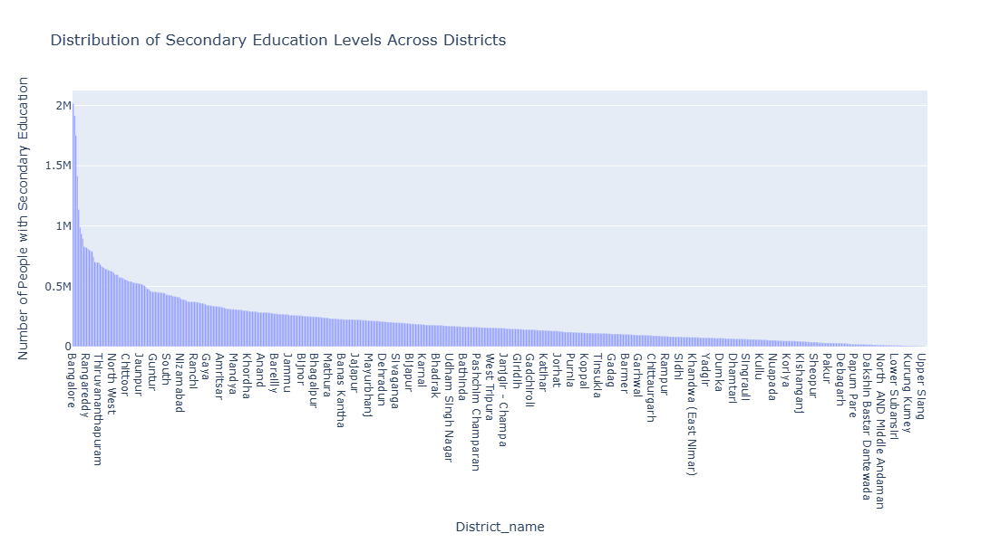

In [98]:
fig = px.bar(district_secondary_education,
             x=district_secondary_education.index, 
             y=district_secondary_education.values,  
             title='Distribution of Secondary Education Levels Across Districts', 
             labels={'x': 'District', 'y': 'Number of People with Secondary Education'}) 
fig.update_layout(
    width=1200, 
    height=600   
)
fig.show()

### 2 How does the percentage of people with higher education vary across states? 

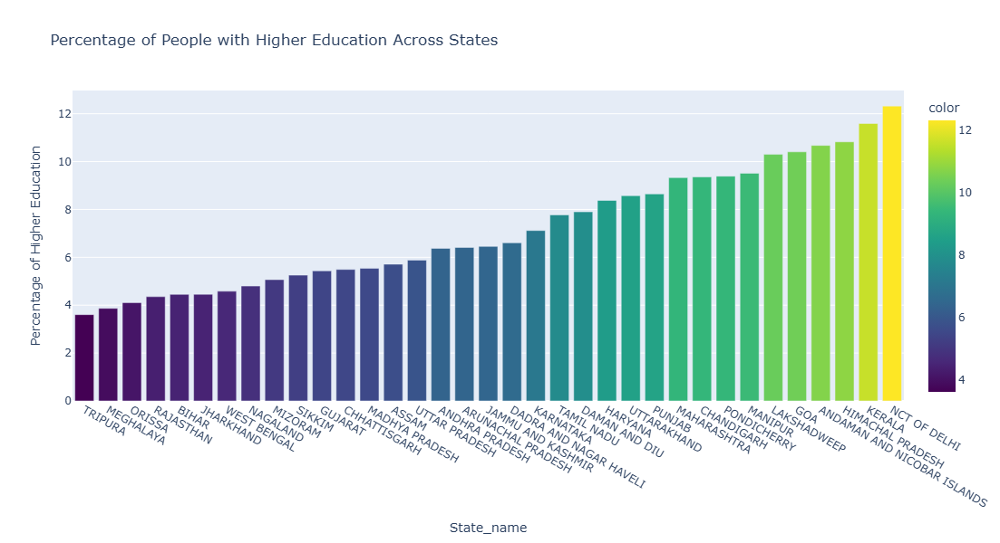

In [6]:
import plotly.express as px
data['Higher_Education_Percentage'] = (data['Higher_Education'] / data['Population']) * 100

state_higher_education = data.groupby('State_name')['Higher_Education_Percentage'].mean().sort_values()

# Create a bar plot using Plotly
fig = px.bar(state_higher_education,
             x=state_higher_education.index,  
             y=state_higher_education.values, 
             title='Percentage of People with Higher Education Across States',  
             labels={'x': 'State', 'y': 'Percentage of Higher Education'},
             color=state_higher_education.values,  
             color_continuous_scale='Viridis',height=600) 

fig.show()


In [8]:
state_higher_education

State_name
TRIPURA                         3.604737
MEGHALAYA                       3.866541
ORISSA                          4.107283
RAJASTHAN                       4.355201
BIHAR                           4.451195
JHARKHAND                       4.456581
WEST BENGAL                     4.582577
NAGALAND                        4.798752
MIZORAM                         5.067392
SIKKIM                          5.253486
GUJARAT                         5.433420
CHHATTISGARH                    5.492936
MADHYA PRADESH                  5.537977
ASSAM                           5.711948
UTTAR PRADESH                   5.884892
ANDHRA PRADESH                  6.375862
ARUNACHAL PRADESH               6.412974
JAMMU AND KASHMIR               6.454518
DADRA AND NAGAR HAVELI          6.604424
KARNATAKA                       7.119125
TAMIL NADU                      7.773323
DAMAN AND DIU                   7.899139
HARYANA                         8.376367
UTTARAKHAND                     8.575811
PUNJA

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_10256\919128259.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




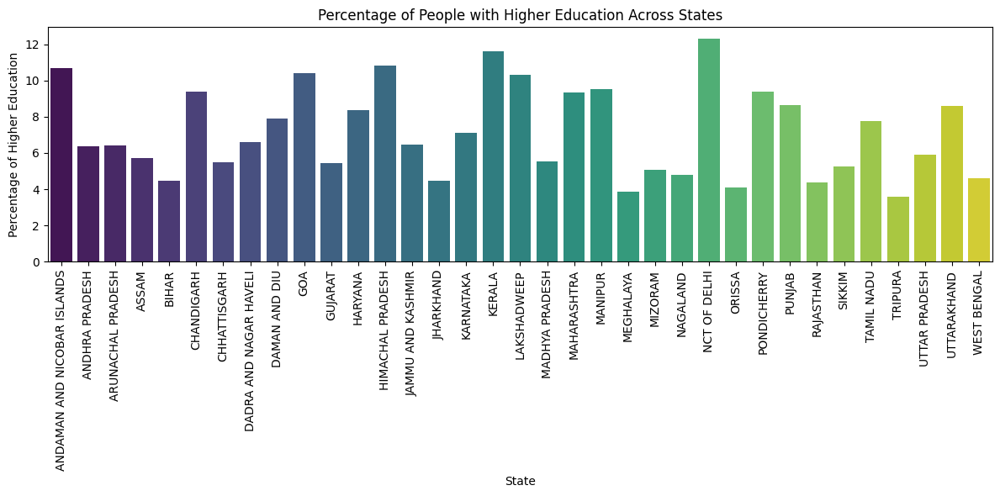

In [9]:
data['Higher_Education_Percentage'] = (data['Higher_Education'] / data['Population']) * 100

# Group by State and calculate the average percentage (or sum if needed) of higher education
state_higher_education = data.groupby('State_name')['Higher_Education_Percentage'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.barplot(x='State_name', y='Higher_Education_Percentage', data=state_higher_education, palette='viridis')
plt.xticks(rotation=90)
plt.title('Percentage of People with Higher Education Across States')
plt.xlabel('State')
plt.ylabel('Percentage of Higher Education')

plt.tight_layout()
plt.show()

### 3 Which states or districts have the highest levels of secondary, higher, and graduate education? 

In [105]:
data['Secondary_Education_Percentage'] = (data['Secondary_Education'] / data['Population']) * 100
data['Higher_Education_Percentage'] = (data['Higher_Education'] / data['Population']) * 100
data['Graduate_Education_Percentage'] = (data['Graduate_Education'] / data['Population']) * 100


top_secondary = data[['State_name', 'District_name', 'Secondary_Education_Percentage']].sort_values(by='Secondary_Education_Percentage', ascending=False).head(5)

top_higher = data[['State_name', 'District_name', 'Higher_Education_Percentage']].sort_values(by='Higher_Education_Percentage', ascending=False).head(5)

top_graduate = data[['State_name', 'District_name', 'Graduate_Education_Percentage']].sort_values(by='Graduate_Education_Percentage', ascending=False).head(5)

print("Top 5 States/Districts with the Highest Secondary Education:")
print(top_secondary)

print("\nTop 5 States/Districts with the Highest Higher Education:")
print(top_higher)

print("\nTop 5 States/Districts with the Highest Graduate Education:")
print(top_graduate)




Top 5 States/Districts with the Highest Secondary Education:
    State_name   District_name  Secondary_Education_Percentage
598     KERALA  Pathanamthitta                       30.994177
597     KERALA       Alappuzha                       26.943743
593     KERALA        Thrissur                       26.330610
596     KERALA        Kottayam                       24.092768
595     KERALA          Idukki                       23.556639

Top 5 States/Districts with the Highest Higher Education:
           State_name   District_name  Higher_Education_Percentage
598            KERALA  Pathanamthitta                    14.438138
596            KERALA        Kottayam                    14.216903
89       NCT OF DELHI      North West                    14.215847
27   HIMACHAL PRADESH        Hamirpur                    14.152931
92       NCT OF DELHI            East                    13.758888

Top 5 States/Districts with the Highest Graduate Education:
       State_name District_name  Gradua

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1413936541.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




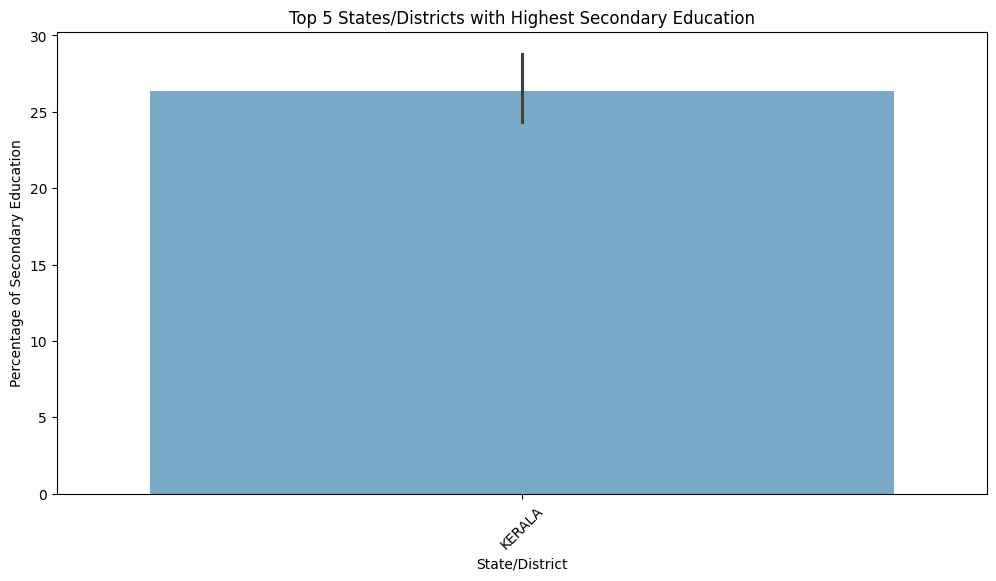

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1413936541.py:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




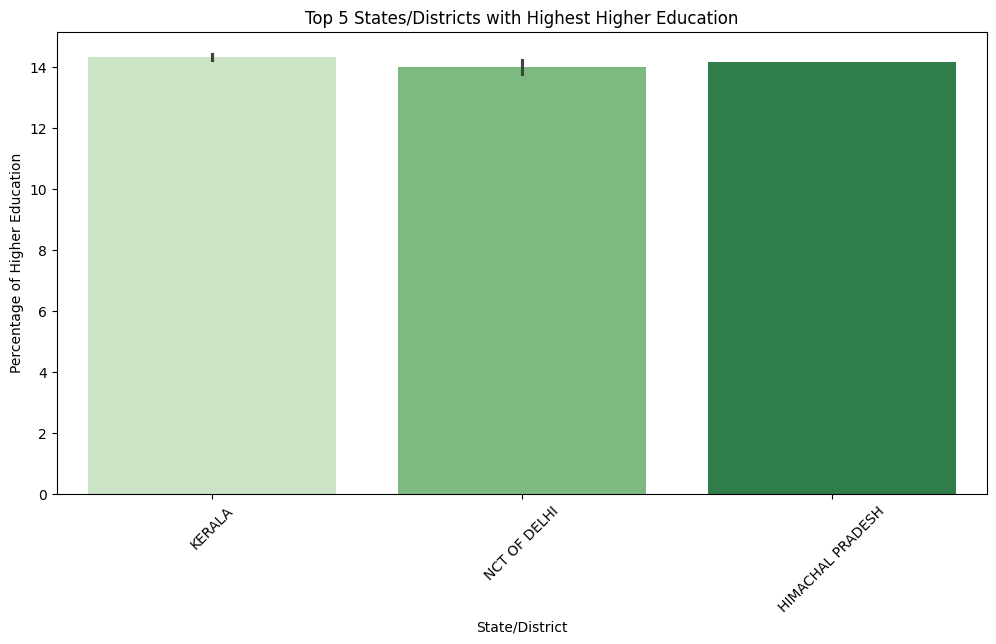

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1413936541.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




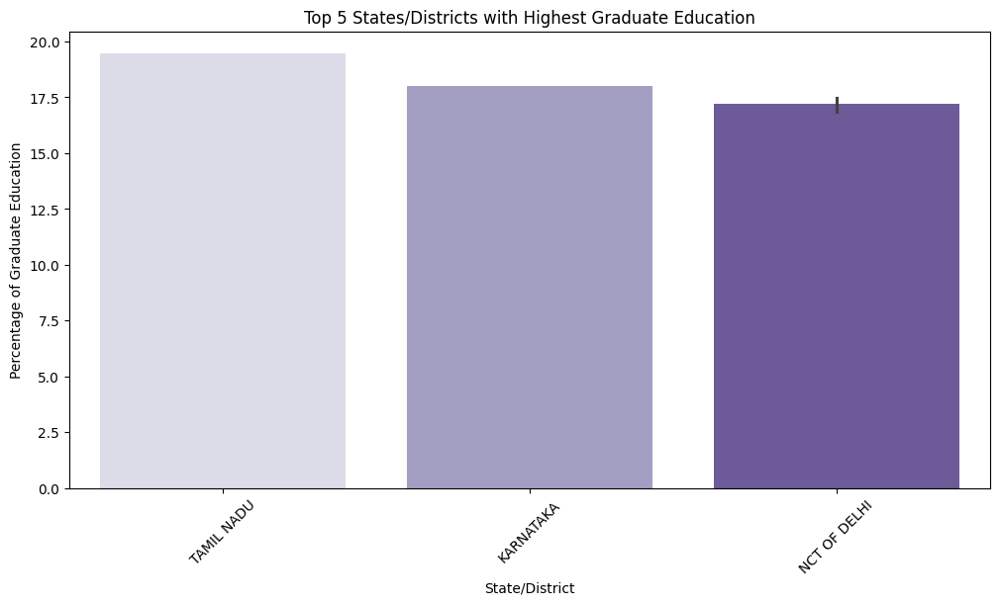

In [106]:
plt.figure(figsize=(12, 6))

# Plotting the top secondary education
sns.barplot(x='State_name', y='Secondary_Education_Percentage', data=top_secondary, palette='Blues')
plt.title('Top 5 States/Districts with Highest Secondary Education')
plt.xlabel('State/District')
plt.ylabel('Percentage of Secondary Education')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))

# Plotting the top higher education
sns.barplot(x='State_name', y='Higher_Education_Percentage', data=top_higher, palette='Greens')
plt.title('Top 5 States/Districts with Highest Higher Education')
plt.xlabel('State/District')
plt.ylabel('Percentage of Higher Education')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))

# Plotting the top graduate education
sns.barplot(x='State_name', y='Graduate_Education_Percentage', data=top_graduate, palette='Purples')
plt.title('Top 5 States/Districts with Highest Graduate Education')
plt.xlabel('State/District')
plt.ylabel('Percentage of Graduate Education')
plt.xticks(rotation=45)
plt.show()

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1336742755.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1336742755.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SACHIN\AppData\Local\Temp\ipykernel_2404\1336742755.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




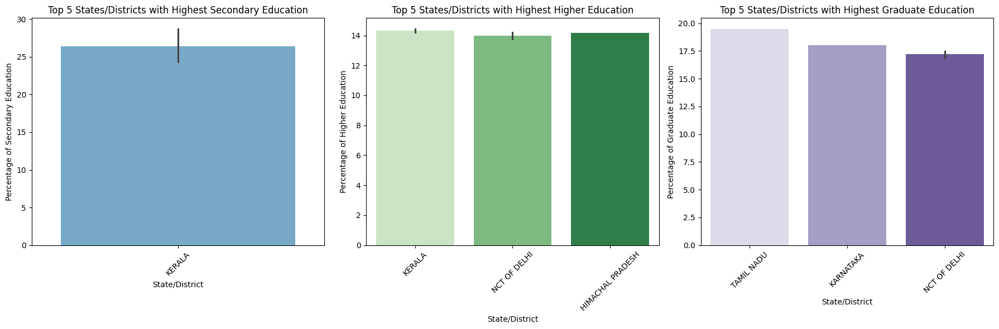

In [107]:

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.barplot(x='State_name', y='Secondary_Education_Percentage', data=top_secondary, palette='Blues', ax=axes[0])
axes[0].set_title('Top 5 States/Districts with Highest Secondary Education')
axes[0].set_xlabel('State/District')
axes[0].set_ylabel('Percentage of Secondary Education')
axes[0].tick_params(axis='x', rotation=45)

sns.barplot(x='State_name', y='Higher_Education_Percentage', data=top_higher, palette='Greens', ax=axes[1])
axes[1].set_title('Top 5 States/Districts with Highest Higher Education')
axes[1].set_xlabel('State/District')
axes[1].set_ylabel('Percentage of Higher Education')
axes[1].tick_params(axis='x', rotation=45)

sns.barplot(x='State_name', y='Graduate_Education_Percentage', data=top_graduate, palette='Purples', ax=axes[2])
axes[2].set_title('Top 5 States/Districts with Highest Graduate Education')
axes[2].set_xlabel('State/District')
axes[2].set_ylabel('Percentage of Graduate Education')
axes[2].tick_params(axis='x', rotation=45)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()


# age groups

### 1 How is the population distributed across age groups (0-29, 30-49, 50+) in different districts? 

In [10]:

data['Age_Group_0_29_Percentage'] = (data['Age_Group_0_29'] / data['Population']) * 100
data['Age_Group_30_49_Percentage'] = (data['Age_Group_30_49'] / data['Population']) * 100
data['Age_Group_50_Percentage'] = (data['Age_Group_50'] / data['Population']) * 100


In [11]:
# Reshape the data to long format for Seaborn
age_group_distribution = data[['District_name', 'Age_Group_0_29_Percentage', 
                              'Age_Group_30_49_Percentage', 'Age_Group_50_Percentage']]
age_group_distribution = age_group_distribution.melt(id_vars='District_name', 
                                                      var_name='Age_Group', 
                                                      value_name='Percentage')


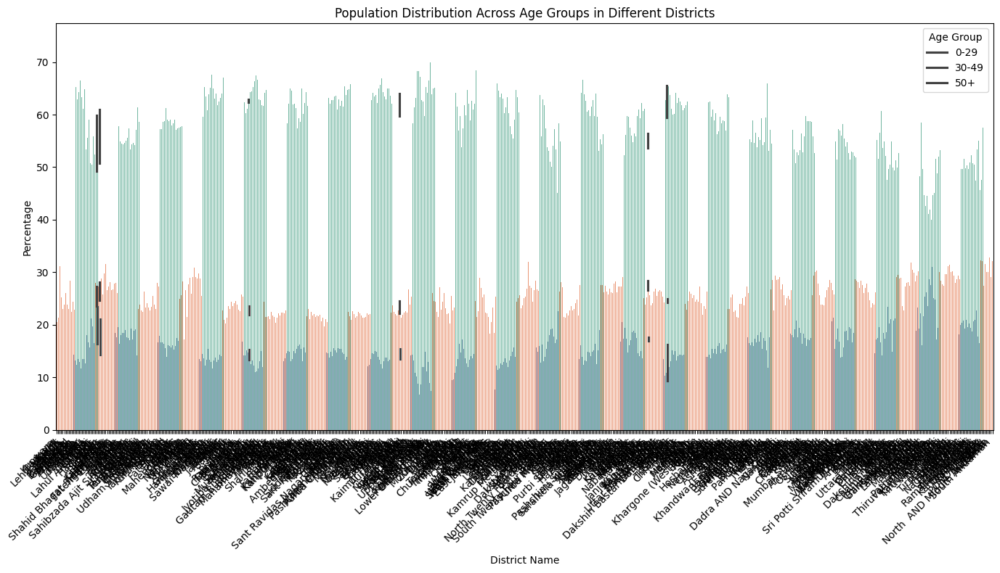

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
sns.barplot(x='District_name', y='Percentage', hue='Age_Group', data=age_group_distribution, palette='Set2')
plt.title('Population Distribution Across Age Groups in Different Districts')
plt.xlabel('District Name')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Age Group', labels=['0-29', '30-49', '50+'])
plt.tight_layout()
plt.show()


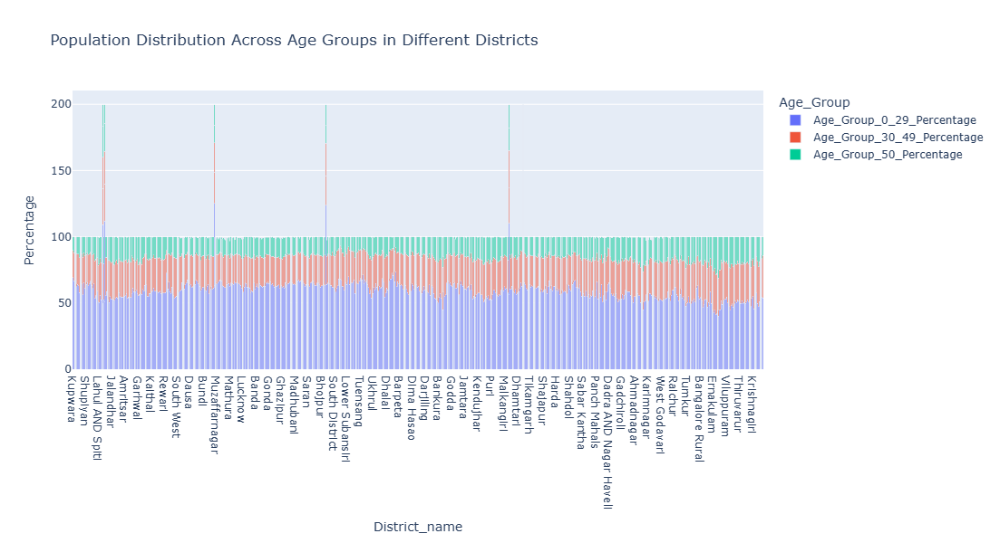

In [12]:
import plotly.express as px
fig=px.bar(age_group_distribution,x='District_name',y='Percentage',
          title='Population Distribution Across Age Groups in Different Districts',
           color='Age_Group',
         barmode='stack',
          height=600)
fig.show()

### 2 What is the proportion of each age group within a state's population? 

In [13]:
state_age_distribution = data.groupby('State_name').agg({
    'Population': 'sum',
    'Age_Group_0_29': 'sum',
    'Age_Group_30_49': 'sum',
    'Age_Group_50': 'sum'
}).reset_index()


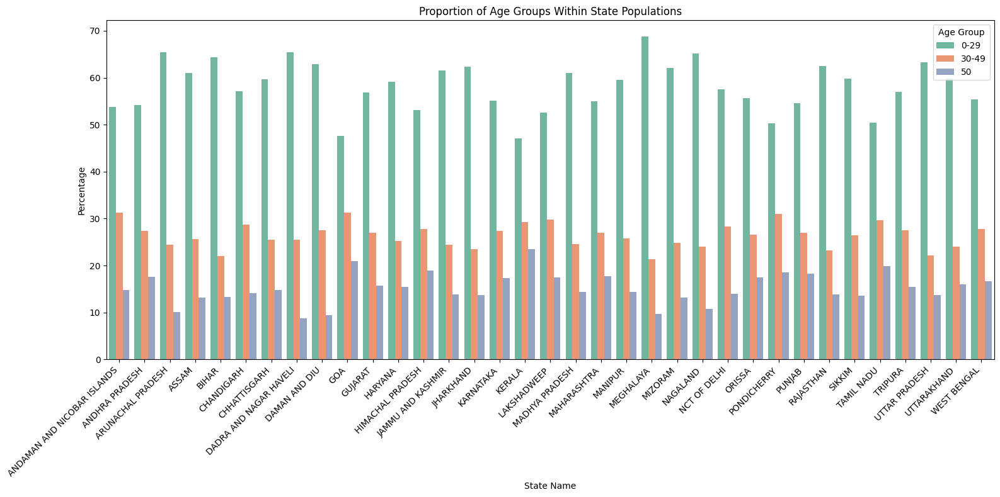

In [16]:
# Calculate the proportion of each age group
state_age_distribution['Age_Group_0_29_Percentage'] = (state_age_distribution['Age_Group_0_29'] / state_age_distribution['Population']) * 100
state_age_distribution['Age_Group_30_49_Percentage'] = (state_age_distribution['Age_Group_30_49'] / state_age_distribution['Population']) * 100
state_age_distribution['Age_Group_50_Percentage'] = (state_age_distribution['Age_Group_50'] / state_age_distribution['Population']) * 100

# Reshape the data to long format
state_age_long = state_age_distribution.melt(
    id_vars='State_name',
    value_vars=['Age_Group_0_29_Percentage', 'Age_Group_30_49_Percentage', 'Age_Group_50_Percentage'],
    var_name='Age_Group',
    value_name='Percentage'
)

# Clean up age group labels
state_age_long['Age_Group'] = state_age_long['Age_Group'].str.replace('_Percentage', '').str.replace('Age_Group_', '').str.replace('_', '-')

plt.figure(figsize=(16, 8))
sns.barplot(x='State_name', y='Percentage', hue='Age_Group', data=state_age_long, palette='Set2')
plt.title('Proportion of Age Groups Within State Populations')
plt.xlabel('State Name')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Age Group')
plt.tight_layout()
plt.show()

### 3 Is there a relationship between age group populations and education levels? 

In [15]:
# Calculate correlation matrix
correlation_matrix = data[['Age_Group_0_29', 'Age_Group_30_49', 'Age_Group_50',
                           'Secondary_Education', 'Higher_Education', 'Graduate_Education']].corr()
correlation_matrix


,Age_Group_0_29,Age_Group_30_49,Age_Group_50,Secondary_Education,Higher_Education,Graduate_Education
Age_Group_0_29,1.000000,0.950222,0.918728,0.802428,0.810612,0.735805
Age_Group_30_49,0.950222,1.000000,0.980269,0.902330,0.892237,0.848076
Age_Group_50,0.918728,0.980269,1.000000,0.897165,0.876930,0.817951
Secondary_Education,0.802428,0.902330,0.897165,1.000000,0.974870,0.916363
Higher_Education,0.810612,0.892237,0.876930,0.974870,1.000000,0.935684
Graduate_Education,0.735805,0.848076,0.817951,0.916363,0.935684,1.000000


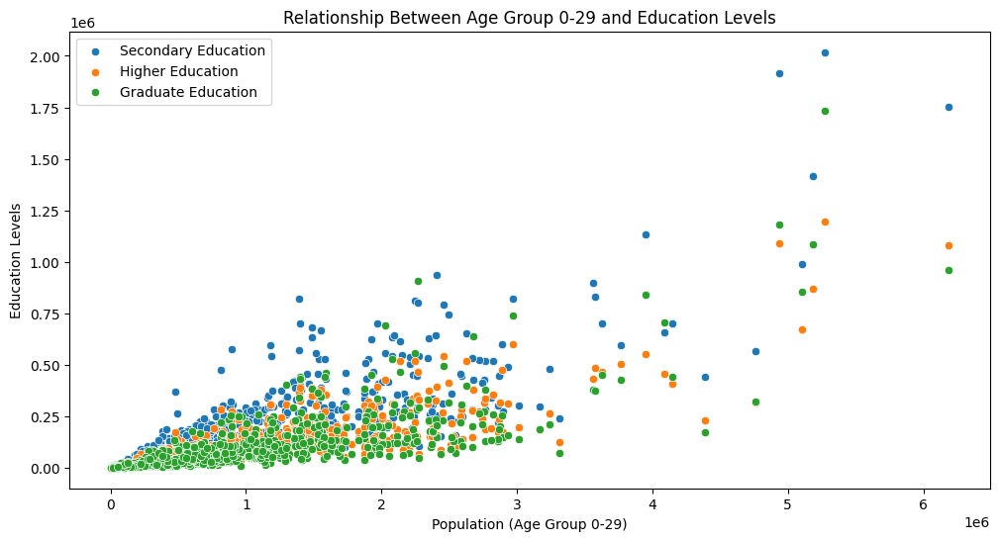

In [16]:
# Scatter plot for Age Group 0-29 and Education Levels
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Age_Group_0_29', y='Secondary_Education', data=data, label='Secondary Education')
sns.scatterplot(x='Age_Group_0_29', y='Higher_Education', data=data, label='Higher Education')
sns.scatterplot(x='Age_Group_0_29', y='Graduate_Education', data=data, label='Graduate Education')
plt.title('Relationship Between Age Group 0-29 and Education Levels')
plt.xlabel('Population (Age Group 0-29)')
plt.ylabel('Education Levels')
plt.legend()
plt.show()


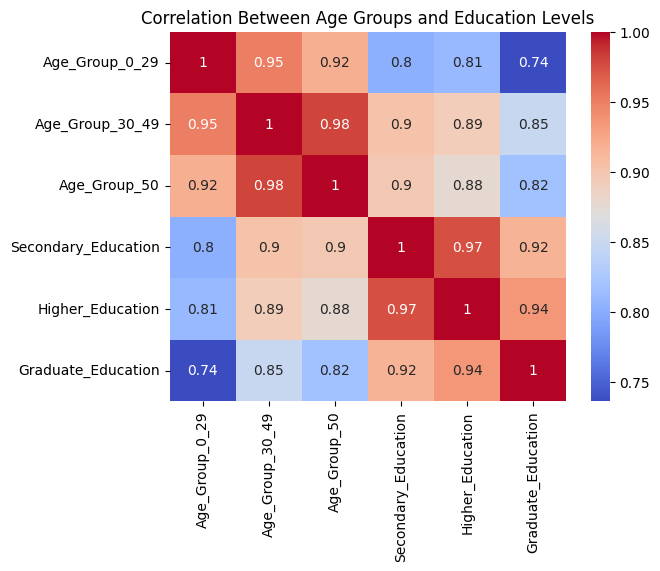

In [17]:
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Between Age Groups and Education Levels')
plt.show()


#  Comparison Between Attributes

### 1 What is the relationship between male workers and female workers across districts?


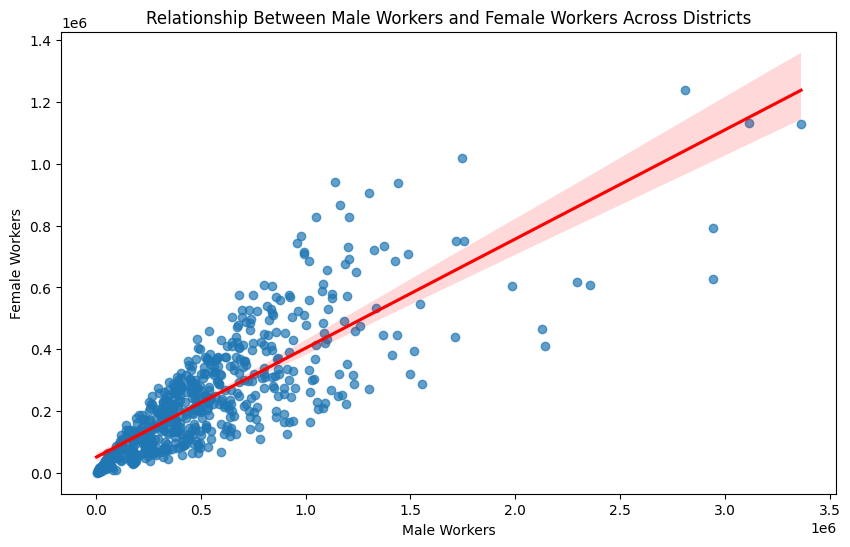

In [19]:

plt.figure(figsize=(10, 6))
sns.regplot(x='Male_Workers', y='Female_Workers', data=data, scatter_kws={'alpha': 0.7}, line_kws={'color': 'red'})
plt.title('Relationship Between Male Workers and Female Workers Across Districts')
plt.xlabel('Male Workers')
plt.ylabel('Female Workers')
plt.show()


In [20]:
correlation = data['Male_Workers'].corr(data['Female_Workers'])
print(f"Correlation Coefficient between Male and Female Workers: {correlation:.2f}")


Correlation Coefficient between Male and Female Workers: 0.81


In [22]:
data['Female_to_Male_Ratio'] = data['Female_Workers'] / data['Male_Workers']
top_districts = data.nlargest(5, 'Female_to_Male_Ratio')[['District_name', 'Female_to_Male_Ratio']]
bottom_districts = data.nsmallest(5, 'Female_to_Male_Ratio')[['District_name', 'Female_to_Male_Ratio']]

print("Top 5 Districts with Highest Female-to-Male Worker Ratios:")
print(top_districts)

print("\nTop 5 Districts with Lowest Female-to-Male Worker Ratios:")
print(bottom_districts)


Top 5 Districts with Highest Female-to-Male Worker Ratios:
    District_name  Female_to_Male_Ratio
57    Rudraprayag              1.159613
62      Bageshwar              1.105982
63         Almora              1.093296
255  Kurung Kumey              1.064355
27       Hamirpur              1.037760

Top 5 Districts with Lowest Female-to-Male Worker Ratios:
    District_name  Female_to_Male_Ratio
91     North East              0.112783
494         Daman              0.116601
21          Samba              0.129027
381       Jajapur              0.136071
70    Yamunanagar              0.136968


### 2 Is there a correlation between the number of workers and religious composition in a district?


In [25]:
# Select relevant columns
columns = ['Workers', 'Male_Workers', 'Female_Workers', 'Hindus', 'Muslims', 'Christians', 'Sikhs', 'Buddhists', 'Jains']
correlation_matrix = data[columns].corr()
correlation_matrix


,Workers,Male_Workers,Female_Workers,Hindus,Muslims,Christians,Sikhs,Buddhists,Jains
Workers,1.000000,0.983043,0.906203,0.957927,0.559514,0.101381,-0.022434,0.294833,0.483890
Male_Workers,0.983043,1.000000,0.813297,0.953595,0.624436,0.103763,0.012230,0.282400,0.502422
Female_Workers,0.906203,0.813297,1.000000,0.840608,0.335455,0.082417,-0.099383,0.284320,0.376851
Hindus,0.957927,0.953595,0.840608,1.000000,0.461884,0.015297,-0.093989,0.227489,0.444000
Muslims,0.559514,0.624436,0.335455,0.461884,1.000000,0.009304,-0.082750,0.100235,0.202665
Christians,0.101381,0.103763,0.082417,0.015297,0.009304,1.000000,-0.039253,0.027878,0.073043
Sikhs,-0.022434,0.012230,-0.099383,-0.093989,-0.082750,-0.039253,1.000000,-0.028379,-0.008323
Buddhists,0.294833,0.282400,0.284320,0.227489,0.100235,0.027878,-0.028379,1.000000,0.386231
Jains,0.483890,0.502422,0.376851,0.444000,0.202665,0.073043,-0.008323,0.386231,1.000000


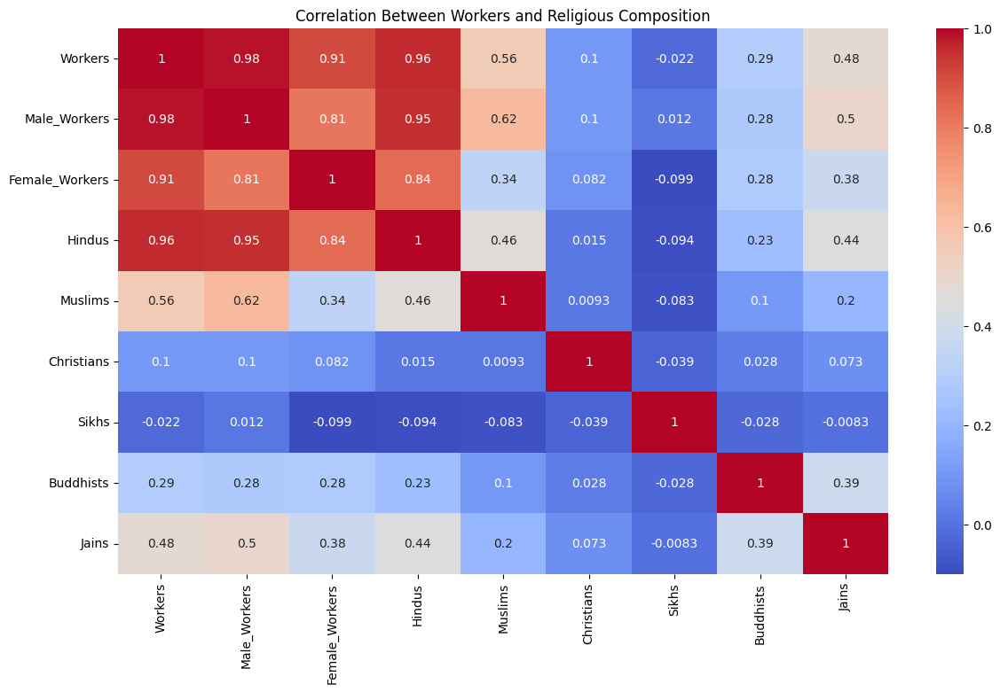

In [26]:
plt.figure(figsize=(14,8))
sns.heatmap(correlation_matrix,annot=True,cmap='coolwarm')
plt.title('Correlation Between Workers and Religious Composition')
plt.show()

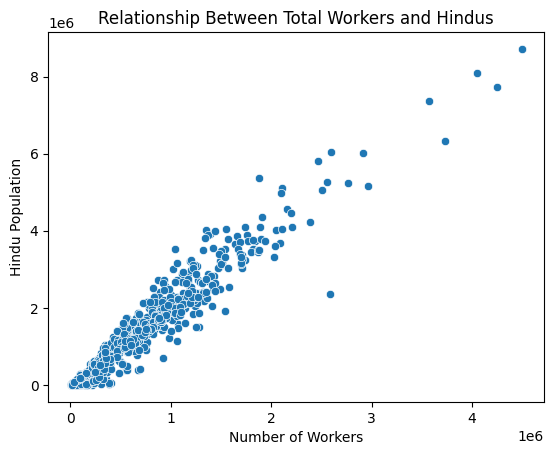

In [27]:
# scatter plot of hindus and workers
sns.scatterplot(x='Workers', y='Hindus', data=data)
plt.title('Relationship Between Total Workers and Hindus')
plt.xlabel('Number of Workers')
plt.ylabel('Hindu Population')
plt.show()

In [29]:
import statsmodels.api as sm
X = data[['Hindus', 'Muslims']]
y = data['Workers']
X = sm.add_constant(X)  # Add constant for the intercept
model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Workers   R-squared:                       0.935
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     4585.
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        12:57:41   Log-Likelihood:                -8555.3
No. Observations:                 640   AIC:                         1.712e+04
Df Residuals:                     637   BIC:                         1.713e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.804e+04   9502.974      6.107      0.000    3.94e+04    7.67e+04
Hindus         0.4219      0.005     78.100      0.000       0.411       0.433
Muslims        0.2151      0.016     13.070      0.000       0.183       0.247
==============================================================================
Omnibus:                       44.041   Durbin-Watson:                   0.544
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              141.245
Skew:                           0.247   Prob(JB):                     2.13e-31
Kurtosis:                       5.248   Cond. No.                     3.11e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.11e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### 3 .How does the number of cultivator workers relate to the number of agricultural workers?

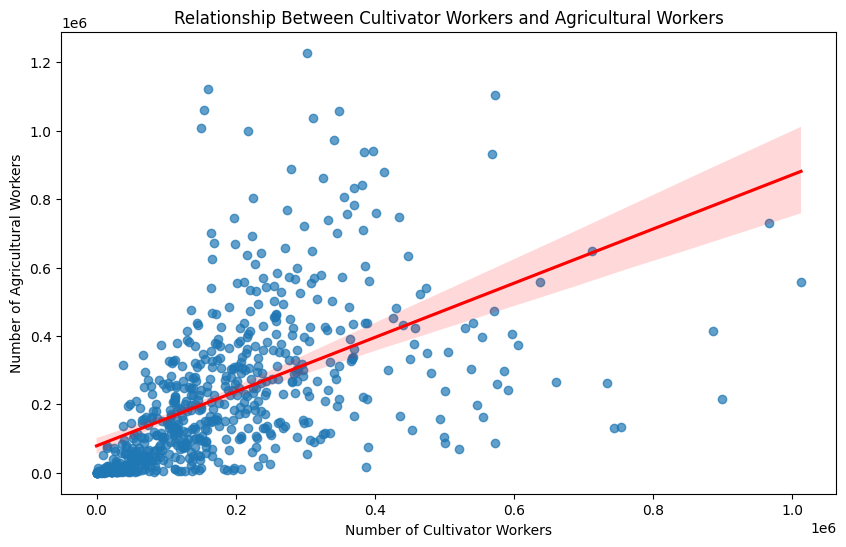

In [30]:
plt.figure(figsize=(10, 6))
sns.regplot(x='Cultivator_Workers', y='Agricultural_Workers', data=data, scatter_kws={'alpha': 0.7}, line_kws={'color': 'red'})
plt.title('Relationship Between Cultivator Workers and Agricultural Workers')
plt.xlabel('Number of Cultivator Workers')
plt.ylabel('Number of Agricultural Workers')
plt.show()

In [31]:
correlation=data['Cultivator_Workers'].corr(data['Agricultural_Workers'])
print(correlation)

0.541660684392677


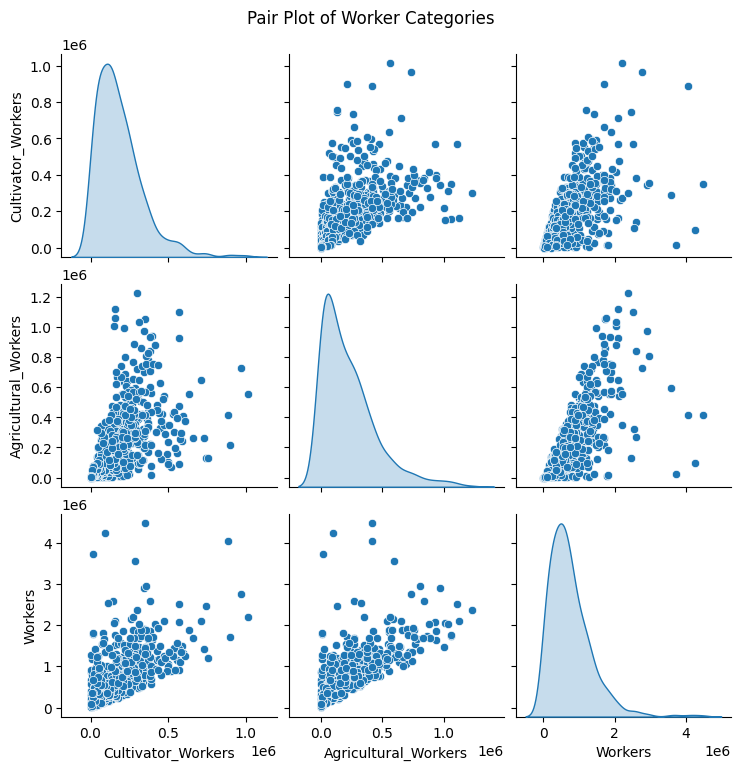

In [34]:
sns.pairplot(data[['Cultivator_Workers', 'Agricultural_Workers', 'Workers']], diag_kind='kde')
plt.suptitle('Pair Plot of Worker Categories', y=1.02)
plt.show()

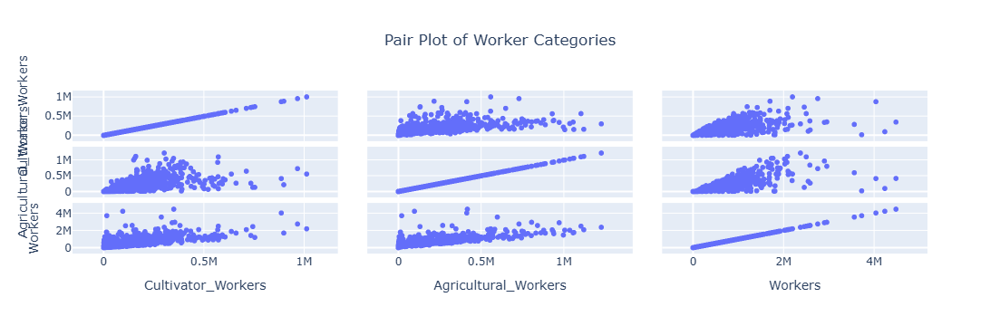

In [36]:
fig = px.scatter_matrix(
    data,
    dimensions=['Cultivator_Workers', 'Agricultural_Workers', 'Workers'],
    title='Pair Plot of Worker Categories',
    height=600
)

fig.update_layout(title_x=0.5)  # Center the title
fig.show()

# . Geographical Trends


### 1. Are there regional trends in literacy, population, or worker distribution across districts?

In [17]:
# Aggregate data by state/region
regional_data = data.groupby('State_name').agg({
    'Population': 'sum',
    'Literate': 'sum',
    'Workers': 'sum',
    'Male_Workers': 'sum',
    'Female_Workers': 'sum'
}).reset_index()

# Calculate literacy rate and worker distribution
regional_data['Literacy_Rate'] = (regional_data['Literate'] / regional_data['Population']) * 100
regional_data['Male_Worker_Percentage'] = (regional_data['Male_Workers'] / regional_data['Workers']) * 100
regional_data['Female_Worker_Percentage'] = (regional_data['Female_Workers'] / regional_data['Workers']) * 100



In [19]:
regional_data.sort_values(by='Female_Worker_Percentage')

,State_name,Population,Literate,Workers,Male_Workers,Female_Workers,Literacy_Rate,Male_Worker_Percentage,Female_Worker_Percentage
8,DAMAN AND DIU,243247,188406,121271,107434,13837,77.454604,88.590017,11.409983
24,NCT OF DELHI,16787941,12737767,5587049,4762026,825023,75.874504,85.233296,14.766704
17,LAKSHADWEEP,64473,52553,18753,15318,3435,81.511641,81.682931,18.317069
27,PUNJAB,27743338,18707137,9897362,8074157,1823205,67.429294,81.578879,18.421121
5,CHANDIGARH,1055450,805438,404136,328159,75977,76.312284,81.200141,18.799859
0,ANDAMAN AND NICOBAR ISLANDS,380581,294281,152535,120889,31646,77.324144,79.253286,20.746714
34,WEST BENGAL,91276115,61538281,34756355,26716047,8040308,67.419917,76.866654,23.133346
11,HARYANA,25351462,16598988,8916508,6806636,2109872,65.475466,76.337463,23.662537
7,DADRA AND NAGAR HAVELI,343709,223230,157161,119293,37868,64.947383,75.904964,24.095036
32,UTTAR PRADESH,199812341,114397555,65814715,49846762,15967953,57.252497,75.738020,24.261980


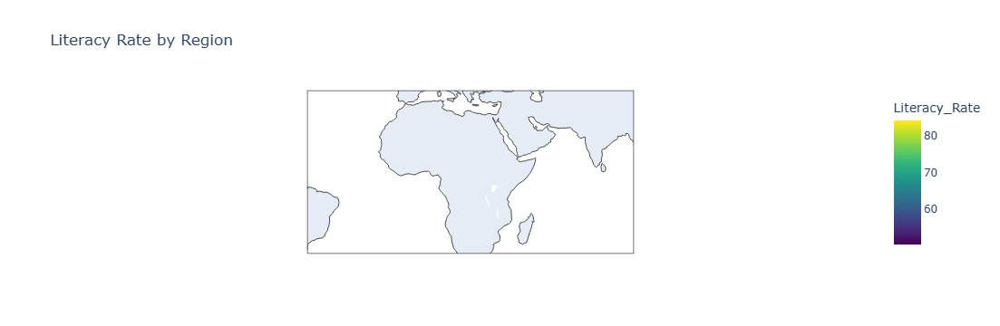

In [39]:
fig = px.choropleth(
    regional_data,
    locations='State_name',
    locationmode='geojson-id',  # Use a GeoJSON for accurate regional mapping
    color='Literacy_Rate',
    title='Literacy Rate by Region',
    color_continuous_scale='Viridis'
)
fig.show()

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_10540\32471728.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




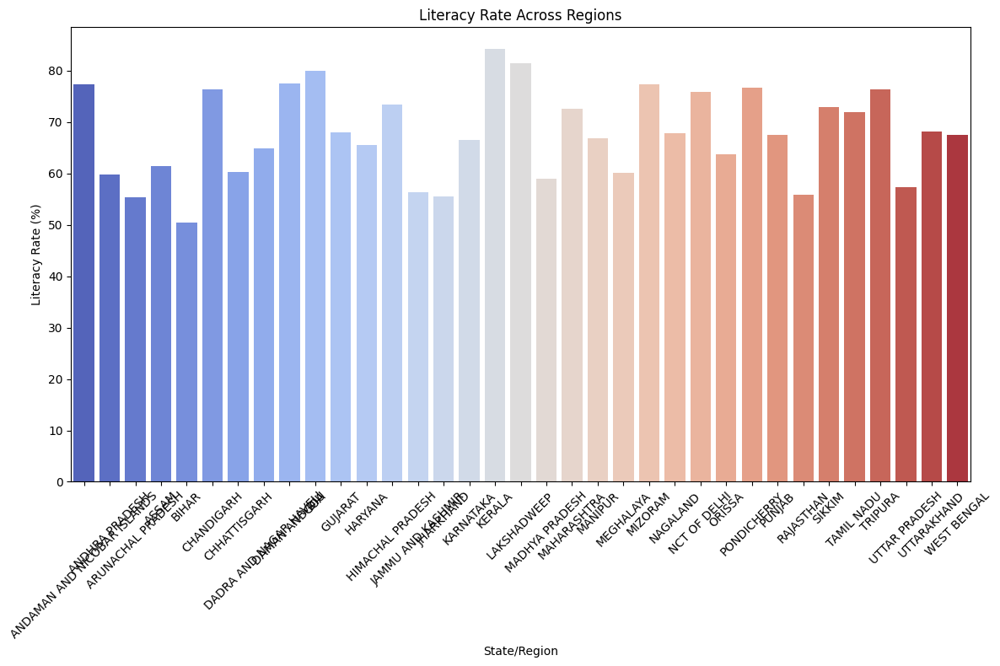

In [43]:
plt.figure(figsize=(12, 8))
sns.barplot(x='State_name', y='Literacy_Rate', data=regional_data, palette='coolwarm')
plt.title('Literacy Rate Across Regions')
plt.xlabel('State/Region')
plt.ylabel('Literacy Rate (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 2 .How do states differ in terms of household workers as a proportion of the total population?

C:\Users\SACHIN\AppData\Local\Temp\ipykernel_10256\432965110.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




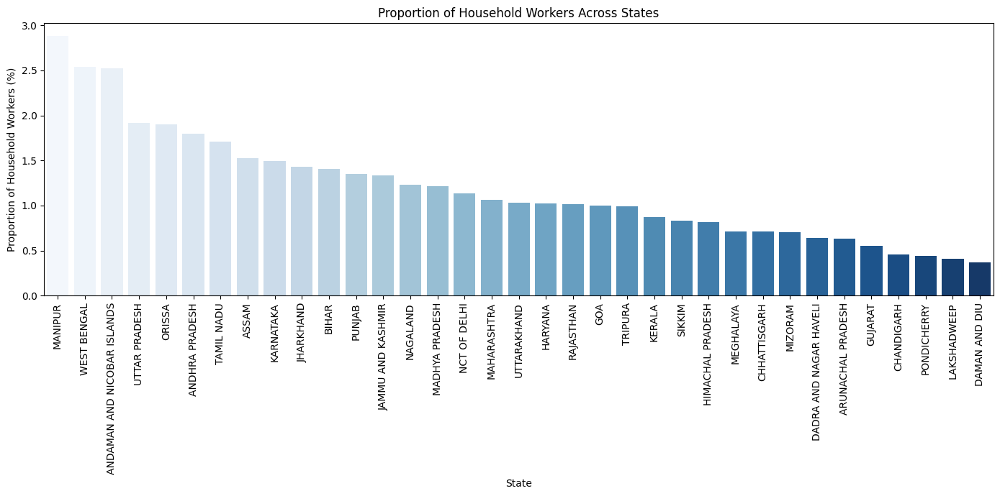

In [25]:
data['Household_Workers_Proportion'] = data['Household_Workers'] / data['Population'] * 100
data_sorted=data.groupby('State_name')['Household_Workers_Proportion'].mean().sort_values(ascending=False).reset_index()
plt.figure(figsize=(14, 7))
sns.barplot(x='State_name', y='Household_Workers_Proportion', data=data_sorted, palette='Blues')
plt.title('Proportion of Household Workers Across States')
plt.xlabel('State')
plt.ylabel('Proportion of Household Workers (%)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

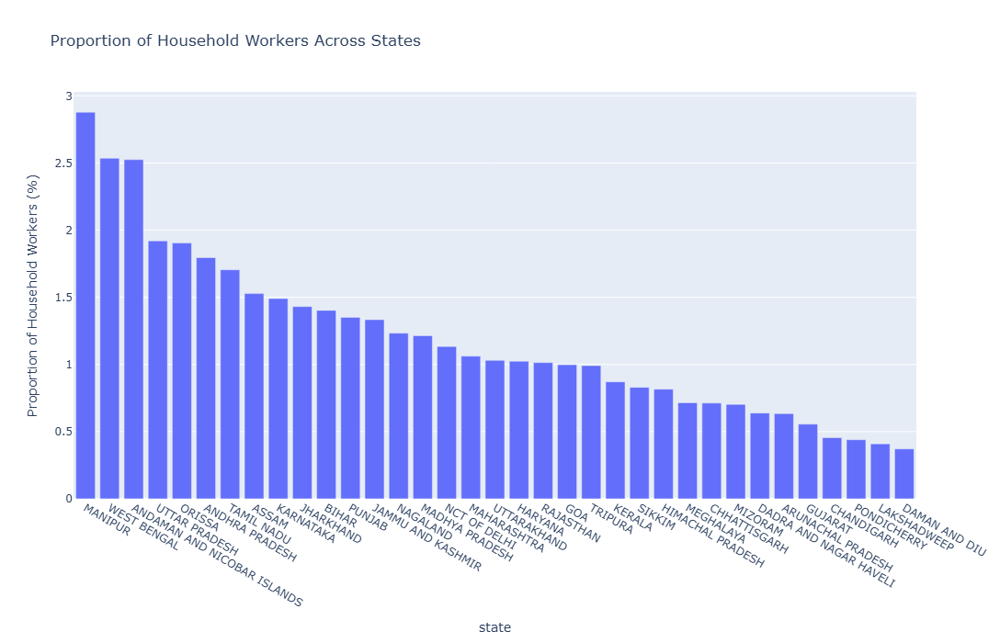

In [27]:
fig=px.bar(data_sorted,x=data_sorted['State_name'],y=data_sorted['Household_Workers_Proportion'],
          title='Proportion of Household Workers Across States',
          labels={'State_name':'state','Household_Workers_Proportion':'Proportion of Household Workers (%)'},
           height=700
           )
fig.show()

#  Top-N Analysis


### 1. Which are the top 10 districts with the highest literacy rates?

      District_name   State_name  Literacy_Rate
598  Pathanamthitta       KERALA      88.737460
596        Kottayam       KERALA      88.617514
635            Mahe  PONDICHERRY      87.215420
597       Alappuzha       KERALA      87.076162
594       Ernakulam       KERALA      86.999952
593        Thrissur       KERALA      85.817891
282          Aizawl      MIZORAM      85.083023
599          Kollam       KERALA      85.007750
588          Kannur       KERALA      84.757489
590       Kozhikode       KERALA      84.743833


C:\Users\SACHIN\AppData\Local\Temp\ipykernel_10540\1651060955.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




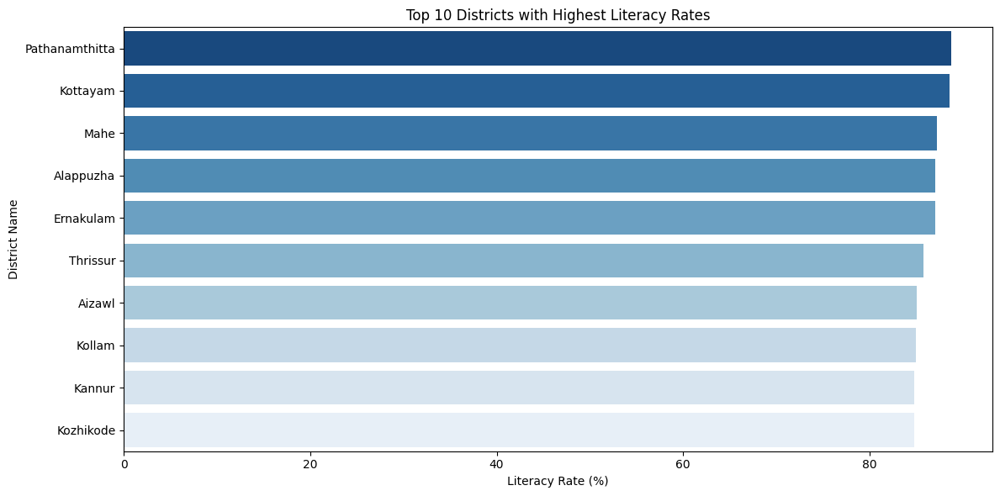

In [53]:
data['Literacy_Rate'] = (data['Literate'] / data['Population']) * 100
top_literacy_districts = data.sort_values(by='Literacy_Rate', ascending=False).head(10)
print(top_literacy_districts[['District_name', 'State_name', 'Literacy_Rate']])

plt.figure(figsize=(12, 6))
sns.barplot(x='Literacy_Rate', y='District_name', data=top_literacy_districts, palette='Blues_r')
plt.title('Top 10 Districts with Highest Literacy Rates')
plt.xlabel('Literacy Rate (%)')
plt.ylabel('District Name')
plt.tight_layout()
plt.show()

### 2 .What are the top 10 districts with the most male or female workers?


In [54]:
top_male_workers = data.sort_values(by='Male_Workers', ascending=False).head(10)

top_female_workers = data.sort_values(by='Female_Workers', ascending=False).head(10)
print("Top 10 Districts with Most Male Workers:")
print(top_male_workers[['District_name', 'State_name', 'Male_Workers']])

# Display top 10 districts for female workers
print("\nTop 10 Districts with Most Female Workers:")
print(top_female_workers[['District_name', 'State_name', 'Female_Workers']])

Top 10 Districts with Most Male Workers:
                  District_name   State_name  Male_Workers
516                       Thane  MAHARASHTRA       3363123
571                   Bangalore    KARNATAKA       3115361
336  North Twenty Four Parganas  WEST BENGAL       2945189
517             Mumbai Suburban  MAHARASHTRA       2944322
520                        Pune  MAHARASHTRA       2809816
342  South Twenty Four Parganas  WEST BENGAL       2356571
334                  Barddhaman  WEST BENGAL       2293083
491                       Surat      GUJARAT       2142819
473                   Ahmadabad      GUJARAT       2127547
332                 Murshidabad  WEST BENGAL       1985667

Top 10 Districts with Most Female Workers:
    District_name      State_name  Female_Workers
520          Pune     MAHARASHTRA         1239177
571     Bangalore       KARNATAKA         1131566
516         Thane     MAHARASHTRA         1129644
515        Nashik     MAHARASHTRA         1017042
537   Mahbubnaga